In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
%xmode minimal
import warnings

warnings.filterwarnings("ignore")

Exception reporting mode: Minimal


In [3]:
%matplotlib inline

In [4]:
import cmocean
import palettable
from matplotlib import pyplot as plt

In [5]:
from IPython.display import clear_output

In [6]:
import pathlib
import sys

In [7]:
import seaborn as sns

In [8]:
from seasonal_forecasting import C3S, domains, geo, plot, utils, verification

In [9]:
from calendar import month_abbr
from datetime import datetime, timedelta

In [10]:
import cartopy.crs as ccrs
import numpy as np
import pandas as pd
import regionmask
import xarray as xr
import xskillscore as xs

### climpred HindcastEnsemble Class + logging

In [11]:
import logging

from climpred import HindcastEnsemble

### progress bar for dask compute 

In [12]:
from dask.diagnostics import ProgressBar

### path definitions 

In [13]:
HOME = pathlib.Path.home()
CWD = pathlib.Path.cwd()

In [14]:
fig_path = pathlib.Path("../figures/verification/SST")

In [15]:
fig_path.mkdir(parents=True, exist_ok=True)

In [16]:
fig_path

PosixPath('../figures/verification/SST')

### parameters for papermill

In [17]:
domain_name = "NZ"
use_verif = "oisst"
GCMs = [
    "ECMWF",
    "UKMO",
    "METEO_FRANCE",
    "DWD",
    "CMCC",
    "NCEP",
    "JMA",
    "ECCC_CanCM4i",
    "ECCC_GEM5_NEMO",
]
varname = "sst"
period = "monthly"  # 'seasonal' or 'monthly'
year_start = 1993
year_end = 2016
obs_to_1deg = False
drop_inits = [
    datetime(1997, 8, 1),
    datetime(1993, 1, 1),
]  # initial times to drop because of issues in NCEP and UKMO respectively
climpred_verbose = False

### logging, to see what `climpred` is doing under the hood, if `climpred_verbose` is set to True, then all inits and corresponding verif times are printed

### Note: setting it to True causes issues with Matplotlib, which outputs endless debug messages related to the font manager, so setting it to `False` is safer

In [18]:
logger = logging.getLogger()

if climpred_verbose:

    logger.setLevel(logging.DEBUG)

else:

    logger.setLevel(logging.INFO)

### dictionnary of domains 

In [19]:
domains.domains

{'Tropical_Pacific': [140, 220, -25, 25],
 'SW_Pacific': [172.5, 190, -22.5, -12],
 'Fiji': [175, 183, -21, -15],
 'NZ': [161, 181, -50, -30],
 'Pacific': [140, 240, -50, 25],
 'C3S_download': [100, 240, -50, 30],
 'Water_Watch': [125, 240, -35, 25]}

In [20]:
domain = domains.domains[domain_name]

### creates a map delineating the validation domain 

In [21]:
area = geo.gpd_from_domain(*domain)

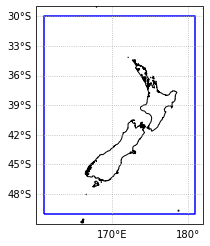

In [22]:
f, ax = plt.subplots(subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
area.geometry.boundary.plot(ax=ax, transform=ccrs.PlateCarree(), color='b')
ax.coastlines(resolution='10m');
# ax.set_title('domain for the calculation of the ACC and RMSE')
gl = ax.gridlines(draw_labels=True, linestyle=':', xlocs=np.arange(-180, 180, 10), crs=ccrs.PlateCarree())
gl.top_labels = False
gl.right_labels = False

### reads in the verification dataset 

In [237]:
if use_verif == "ersst":
    _, dset_obs = verification.get_ERSST(
        access="opendap", start=year_start, end=year_end, detrend=True
    )
elif use_verif == "oisst":
    _, dset_obs = verification.get_OISST(start=year_start, end=year_end, detrend=True)

### regrid to 1deg X 1deg (if `obs_to_1deg` is set to True)

In [238]:
if obs_to_1deg:
    dset_obs = utils.interp_to_1x(dset_obs)

### now selects domain 

In [239]:
dset_obs = dset_obs.sel(lon=slice(*domain[:2]), lat=slice(*domain[2:]))

In [240]:
dset_obs

<xarray.Dataset>
Dimensions:  (time: 288, lat: 80, lon: 80)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2016-12-01
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
Data variables:
    sst      (time, lat, lon) float64 0.3522 0.358 0.3211 ... -0.04658 -0.11

### creates a mask from the observational dataset 

In [241]:
mask_obs = dset_obs.mean(dim="time")

In [242]:
mask_obs = mask_obs.where(np.isnan(mask_obs), 1)

In [243]:
mask_obs = mask_obs.rename({varname: "mask"})["mask"]

### plots the mask 

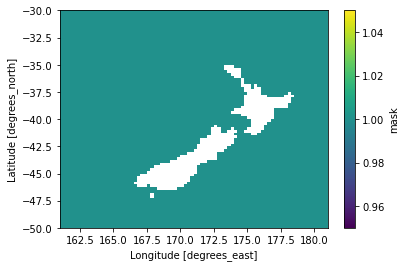

In [244]:
mask_obs.plot()

### calculates seasonal averages if 'seasonal' 

In [245]:
if period == "seasonal":
    dset_obs = dset_obs.rolling({"time": 3}, min_periods=3).mean("time")
    dset_obs = dset_obs.isel(time=slice(2, None))

### calculate the persistence, with lags 

In [251]:
Rs = []
for tshift in [2,3,4,5,6]: 
    dset_obs_shift = dset_obs.shift(time=tshift)
    dset_obs_shift = dset_obs_shift.dropna('time', how='all')
    ts, t = xr.align(dset_obs_shift.time, dset_obs.time)
    R = xs.pearson_r(dset_obs_shift.sel(time=t), dset_obs.sel(time=t))
    Rs.append(float(R[varname].data))

In [258]:
Rs_maps = []
for tshift in [2,3,4,5,6]: 
    
    dset_obs_shift = dset_obs.shift(time=tshift)
    
    dset_obs_shift = dset_obs_shift.dropna('time', how='all')
    
    ts, t = xr.align(dset_obs_shift.time, dset_obs.time)
    
    Rs_maps_month = []
    
    for m in np.arange(12) + 1: 
        
        ts_m = (ts.dt.month == m)
        
        R = xs.pearson_r(dset_obs_shift.sel(time=ts_m), dset_obs.sel(time=ts_m), dim='time')
        
        R = R.expand_dims({'month':[m]})
        
        Rs_map_month.append(R)
    
    Rs_map_month = xr.concat(Rs_map_month, dim='month')
        
    Rs_map_month = Rs_map_month.expand_dims({'lag':[tshift]})
    
    Rs_maps.append(Rs_map_month) 

IndexError: Boolean index has wrong length: 286 instead of 288

In [260]:
tshift = 2

In [261]:
dset_obs_shift = dset_obs.shift(time=tshift)

dset_obs_shift = dset_obs_shift.dropna('time', how='all')

ts, t = xr.align(dset_obs_shift.time, dset_obs.time)

In [264]:
dset_obs.sel(time=(t.dt.month == 1))

IndexError: Boolean index has wrong length: 286 instead of 288

In [263]:
dset_obs_shift.sel(time=t)

<xarray.Dataset>
Dimensions:  (time: 286, lat: 80, lon: 80)
Coordinates:
  * time     (time) datetime64[ns] 1993-03-01 1993-04-01 ... 2016-12-01
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
Data variables:
    sst      (time, lat, lon) float64 0.3522 0.358 0.3211 ... 0.5904 0.8478

In [267]:
Rs_maps = []
for tshift in [2,3,4,5,6]: 
    
    dset_obs_shift = dset_obs.shift(time=tshift)
    
    dset_obs_shift = dset_obs_shift.dropna('time', how='all')
    
    ts, t = xr.align(dset_obs_shift.time, dset_obs.time)
    
    dset_obs_sub = dset_obs.sel(time=t)
    dset_obs_shift_sub = dset_obs_shift.sel(time=t)
    
    Rs_maps_month = []
    
    for m in np.arange(12) + 1: 
        
        ts_m = (t.dt.month == m)
        
        R = xs.pearson_r(dset_obs_shift_sub.sel(time=ts_m), dset_obs_sub.sel(time=ts_m), dim='time')
        
        R = R.expand_dims({'month':[m]})
        
        Rs_maps_month.append(R)
    
    Rs_maps_month = xr.concat(Rs_maps_month, dim='month')
        
    Rs_maps_month = Rs_maps_month.expand_dims({'lag':[tshift]})
    
    Rs_maps.append(Rs_maps_month) 

In [269]:
Rs_maps = xr.concat(Rs_maps, dim='lag')

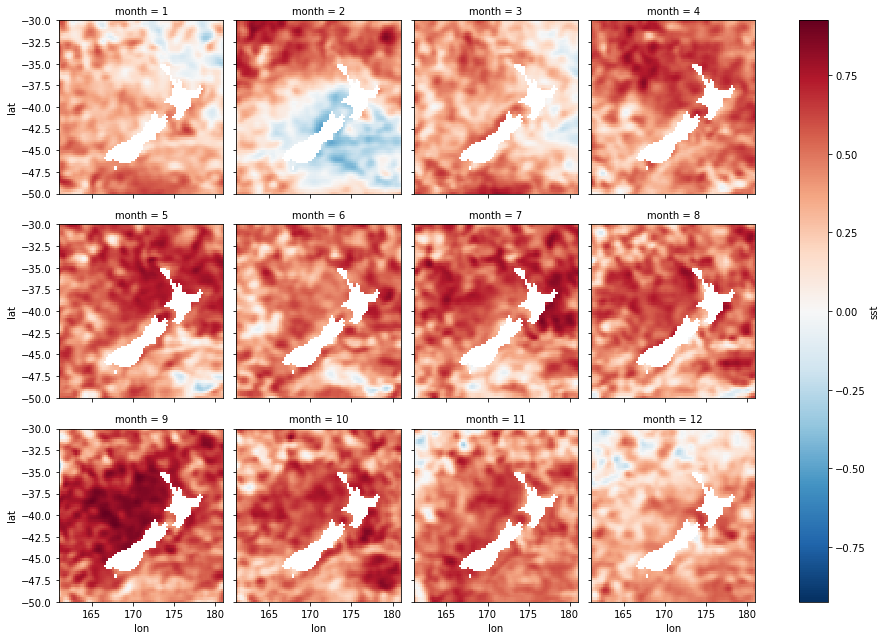

In [272]:
Rs_maps.sel(lag=2)[varname].plot(col='month', col_wrap=4)

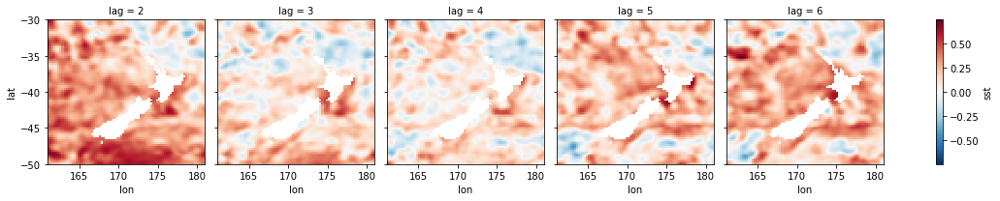

In [275]:
Rs_maps.sel(month=1)[varname].plot(col='lag')

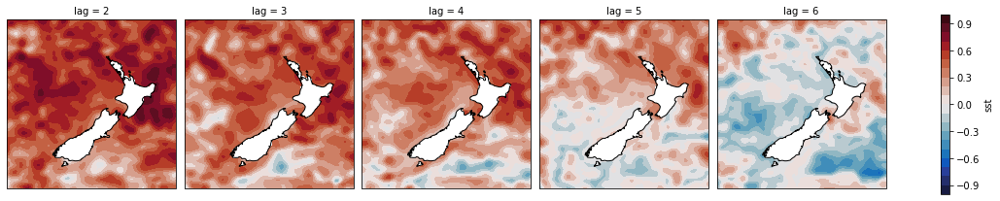

In [281]:

fg = Rs_maps.sel(month=7)[varname].plot.contourf(
    levels=np.arange(-1, 1.01, 0.1),
    col="lag",
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude=180)},
    transform=ccrs.PlateCarree(),
    cmap=cmap,
)
[ax.coastlines() for ax in fg.axes.flat]


In [106]:
persistence_df = pd.DataFrame(Rs, index=np.arange(5) + 1, columns=['persistence (lagged)'])

<AxesSubplot:>

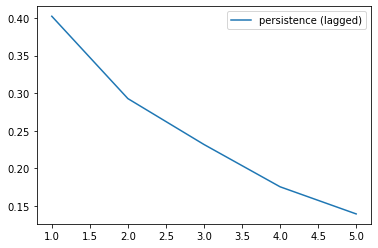

In [107]:
persistence_df.plot()

### Now reads in the GCM hindcasts (reforecasts)

In [35]:
dpath = "/media/nicolasf/END19101/ICU/data/CDS/operational/hindcasts/"

In [36]:
MME = C3S.get_GCMs(dpath=dpath, GCM=GCMs, varname=varname, domain=domain)

---------------------------------------------------
reading ECMWF

getting GCM data from /media/nicolasf/END19101/ICU/data/CDS/operational/hindcasts/ECMWF/SST
reading 288 files

first: /media/nicolasf/END19101/ICU/data/CDS/operational/hindcasts/ECMWF/SST/ensemble_seas_forecasts_sst_from_1993_01_ECMWF.netcdf
last: /media/nicolasf/END19101/ICU/data/CDS/operational/hindcasts/ECMWF/SST/ensemble_seas_forecasts_sst_from_2016_12_ECMWF.netcdf
---------------------------------------------------
reading UKMO

getting GCM data from /media/nicolasf/END19101/ICU/data/CDS/operational/hindcasts/UKMO/SST
reading 287 files

first: /media/nicolasf/END19101/ICU/data/CDS/operational/hindcasts/UKMO/SST/ensemble_seas_forecasts_sst_from_1993_02_UKMO.netcdf
last: /media/nicolasf/END19101/ICU/data/CDS/operational/hindcasts/UKMO/SST/ensemble_seas_forecasts_sst_from_2016_12_UKMO.netcdf
---------------------------------------------------
reading METEO_FRANCE

getting GCM data from /media/nicolasf/END19101/ICU/dat

### drop the problematic initialisation times from the dataset 

In [37]:
for drop_date in drop_inits:
    MME = MME.drop_sel(time=drop_date)

In [38]:
MME

<xarray.Dataset>
Dimensions:  (time: 286, lon: 21, lat: 21, step: 5, GCM: 9)
Coordinates:
  * time     (time) datetime64[ns] 1993-02-01 1993-03-01 ... 2016-12-01
  * lon      (lon) float32 161.0 162.0 163.0 164.0 ... 178.0 179.0 180.0 181.0
  * lat      (lat) float32 -50.0 -49.0 -48.0 -47.0 ... -33.0 -32.0 -31.0 -30.0
  * step     (step) int64 1 2 3 4 5
  * GCM      (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_CanCM4i' 'ECCC_GEM5_NEMO'
    month    (GCM, time) float64 2.0 3.0 4.0 5.0 6.0 ... 8.0 9.0 10.0 11.0 12.0
Data variables:
    sst      (GCM, time, step, lat, lon) float32 dask.array<chunksize=(1, 1, 2, 21, 21), meta=np.ndarray>

### calculates seasonal averages if 'seasonal'

In [39]:
if period == "seasonal":
    MME = MME.rolling({"step": 3}, min_periods=3).mean("step")
    MME = MME.sel(step=slice(3, None))

In [40]:
MME

<xarray.Dataset>
Dimensions:  (time: 286, lon: 21, lat: 21, step: 5, GCM: 9)
Coordinates:
  * time     (time) datetime64[ns] 1993-02-01 1993-03-01 ... 2016-12-01
  * lon      (lon) float32 161.0 162.0 163.0 164.0 ... 178.0 179.0 180.0 181.0
  * lat      (lat) float32 -50.0 -49.0 -48.0 -47.0 ... -33.0 -32.0 -31.0 -30.0
  * step     (step) int64 1 2 3 4 5
  * GCM      (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_CanCM4i' 'ECCC_GEM5_NEMO'
    month    (GCM, time) float64 2.0 3.0 4.0 5.0 6.0 ... 8.0 9.0 10.0 11.0 12.0
Data variables:
    sst      (GCM, time, step, lat, lon) float32 dask.array<chunksize=(1, 1, 2, 21, 21), meta=np.ndarray>

### transpose to have GCM and time as the first 2 dimensions 

In [41]:
MME = MME.transpose("GCM", "time", "step", "lat", "lon")

## interpolate the NaNs (takes a while, eats memory ... )

In [42]:
with ProgressBar():
    sst_interp = utils.interpolate_NaN_da(MME[varname].load())

[########################################] | 100% Completed | 25.85 s


In [43]:
MME[varname] = sst_interp

### plot the resulting interpolated SST anomalies 

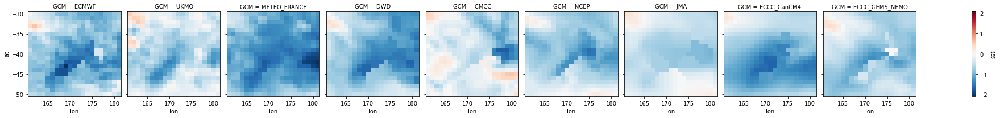

In [44]:
MME.isel(time=0, step=0)[varname].plot(col="GCM")

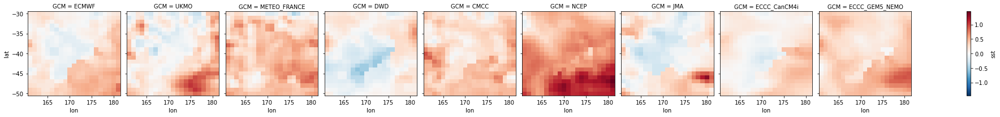

In [45]:
MME.isel(time=-1, step=0)[varname].plot(col="GCM")

### Now, if `obs_to_1deg` is set to False, it means that the MME needs to be interpolated onto the obs dataset grid 

In [46]:
if not (obs_to_1deg):
    MME = MME.interp_like(dset_obs[["lon", "lat"]])

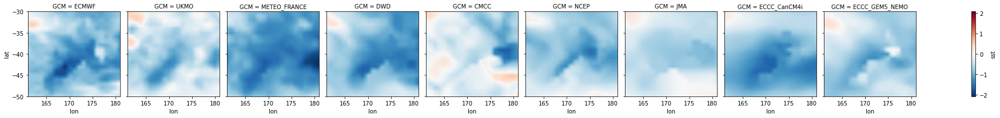

In [47]:
MME.isel(time=0, step=0)[varname].plot(col="GCM")

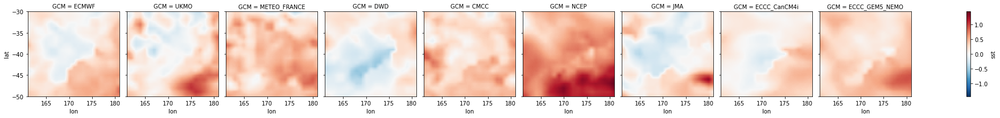

In [48]:
MME.isel(time=-1, step=0)[varname].plot(col="GCM")

### re-chunk, each chunk will take ~ 7 Mb in memory

In [49]:
MME = MME.chunk({"GCM": -1, "time": -1, "step": -1, "lon": -1, "lat": -1})

In [50]:
MME

<xarray.Dataset>
Dimensions:  (time: 286, step: 5, GCM: 9, lat: 80, lon: 80)
Coordinates:
  * time     (time) datetime64[ns] 1993-02-01 1993-03-01 ... 2016-12-01
  * step     (step) int64 1 2 3 4 5
  * GCM      (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_CanCM4i' 'ECCC_GEM5_NEMO'
    month    (GCM, time) float64 dask.array<chunksize=(9, 286), meta=np.ndarray>
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
Data variables:
    sst      (GCM, time, step, lat, lon) float32 dask.array<chunksize=(9, 286, 5, 80, 80), meta=np.ndarray>

### add the ensemble mean to the set of GCMs

In [51]:
MME_mean = MME.mean("GCM")

In [52]:
MME_mean

<xarray.Dataset>
Dimensions:  (time: 286, step: 5, lat: 80, lon: 80)
Coordinates:
  * time     (time) datetime64[ns] 1993-02-01 1993-03-01 ... 2016-12-01
  * step     (step) int64 1 2 3 4 5
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
Data variables:
    sst      (time, step, lat, lon) float32 dask.array<chunksize=(286, 5, 80, 80), meta=np.ndarray>

In [53]:
MME_mean = MME_mean.expand_dims({"GCM": ["MME"]})

In [54]:
MME

<xarray.Dataset>
Dimensions:  (time: 286, step: 5, GCM: 9, lat: 80, lon: 80)
Coordinates:
  * time     (time) datetime64[ns] 1993-02-01 1993-03-01 ... 2016-12-01
  * step     (step) int64 1 2 3 4 5
  * GCM      (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_CanCM4i' 'ECCC_GEM5_NEMO'
    month    (GCM, time) float64 dask.array<chunksize=(9, 286), meta=np.ndarray>
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
Data variables:
    sst      (GCM, time, step, lat, lon) float32 dask.array<chunksize=(9, 286, 5, 80, 80), meta=np.ndarray>

In [55]:
if "month" in MME.coords:
    MME = MME.drop("month")

In [56]:
MME = xr.concat([MME, MME_mean], dim="GCM")

In [57]:
MME

<xarray.Dataset>
Dimensions:  (time: 286, step: 5, GCM: 10, lat: 80, lon: 80)
Coordinates:
  * time     (time) datetime64[ns] 1993-02-01 1993-03-01 ... 2016-12-01
  * step     (step) int64 1 2 3 4 5
  * GCM      (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_GEM5_NEMO' 'MME'
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
Data variables:
    sst      (GCM, time, step, lat, lon) float32 dask.array<chunksize=(9, 286, 5, 80, 80), meta=np.ndarray>

In [58]:
with ProgressBar():
    MME = MME.compute()

[########################################] | 100% Completed | 302.85 ms


### check all the dimensions and coordinates of the MME and the observational dataset 

In [59]:
MME

<xarray.Dataset>
Dimensions:  (time: 286, step: 5, GCM: 10, lat: 80, lon: 80)
Coordinates:
  * time     (time) datetime64[ns] 1993-02-01 1993-03-01 ... 2016-12-01
  * step     (step) int64 1 2 3 4 5
  * GCM      (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_GEM5_NEMO' 'MME'
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
Data variables:
    sst      (GCM, time, step, lat, lon) float32 -0.5694 -0.5745 ... 0.278

In [60]:
dset_obs

<xarray.Dataset>
Dimensions:  (time: 288, lat: 80, lon: 80)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2016-12-01
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
Data variables:
    sst      (time, lat, lon) float64 0.3522 0.358 0.3211 ... -0.04658 -0.11

### Plots each time step and each leadtime for 'visual' check 

In [61]:
# while 0:
#     fpath = pathlib.Path('./tmp')

#     if not fpath.exists():
#         fpath.mkdir(parents=True)

#     for t in range(len(MME.time)):
#         for s in range(len(MME.step)):
#             fg = MME.isel(time=t, step=s)['sst'].plot(col='GCM', vmin=-2, vmax=2, cmap=plt.cm.RdBu_r)
#             fg.fig.savefig(f'./tmp/MME_time_{t}_step_{s}.png', facecolor='w')
#             plt.close(fg.fig)

### we apply the observational land sea mask to the MME 

In [62]:
MME = MME * mask_obs

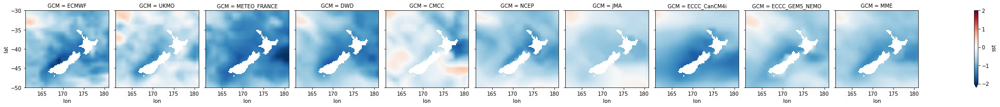

In [63]:
MME.isel(time=0, step=0)["sst"].plot(col="GCM", vmin=-2, vmax=2, cmap=plt.cm.RdBu_r)

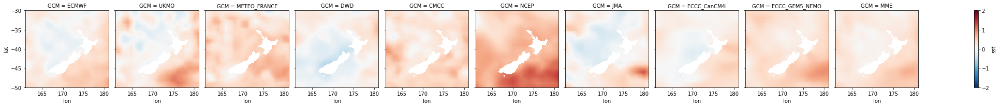

In [64]:
MME.isel(time=-1, step=0)["sst"].plot(col="GCM", vmin=-2, vmax=2, cmap=plt.cm.RdBu_r)

### we can now just fill the missing values (land) with 0, as the subsequent operations do not support missing values 

In [65]:
MME = MME.fillna(0.0)

In [66]:
dset_obs = dset_obs.fillna(0.0)

In [67]:
with ProgressBar():
    MME = MME.compute()
    dset_obs = dset_obs.compute()

### process to make all the variables and dimension names compatible with climpred

In [68]:
MME = verification.process_for_climpred(MME)

In [69]:
MME

<xarray.Dataset>
Dimensions:  (GCM: 10, init: 286, lead: 5, lat: 80, lon: 80)
Coordinates:
  * init     (init) datetime64[ns] 1993-02-01 1993-03-01 ... 2016-12-01
  * lead     (lead) int64 1 2 3 4 5
  * GCM      (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_GEM5_NEMO' 'MME'
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
Data variables:
    sst      (GCM, init, lead, lat, lon) float64 -0.5694 -0.5745 ... 0.278

### re-chunk the MME 

In [70]:
MME = MME.chunk({"init": -1, "lead": 1, "lat": -1, "lon": -1})

### re-chunk the observations 

In [71]:
dset_obs = dset_obs.chunk({"time": -1, "lat": -1, "lon": -1})

In [72]:
dset_obs.chunks

Frozen({'time': (288,), 'lat': (80,), 'lon': (80,)})

### Try and create the hindcast ensemble over all the GCMs (including the MME)

In [73]:
hindcast = HindcastEnsemble(MME)

In [74]:
hindcast

climpred.HindcastEnsemble

<Initialized Ensemble>
Dimensions: (GCM: 10, init: 286, lead: 5, lat: 80, lon: 80)
Coordinates:
 * init (init) object 1993-02-01 00:00:00 ... 2016-12-01 00:00:00
 * lead (lead) int64 1 2 3 4 5
 * GCM (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_GEM5_NEMO' 'MME'
 * lon (lon) float32 161.1 161.4 161.6 161.9 ... 180.4 180.6 180.9
 * lat (lat) float32 -49.88 -49.62 -49.38 ... -30.62 -30.38 -30.12
 valid_time (lead, init) object 1993-03-01 00:00:00 ... 2017-05-01 00:00:00
Data variables:
 sst (GCM, init, lead, lat, lon) float64 dask.array<chunksize=(10, 286, 1, 80, 80), meta=np.ndarray> Initialized Ensemble Dimensions: GCM : 10 init : 286 lead : 5 lat : 80 lon : 80 Coordinates: (6) init (init) object 1993-02-01 00:00:00 ... 2016-12-... standard_name : forecast_reference_time long_name : Initialization description : The forecast reference time in NWP is the "data time", the time of the analysis from which the forecast was made. It is not the time for which the forecast is valid; the standard name of time should be used for that time. array([cftime.DatetimeProlepticGregorian(1993, 2, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(1993, 3, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(1993, 4, 1, 0, 0, 0, 0, has_year_zero=True),
 ...,
 cftime.DatetimeProlepticGregorian(2016, 10, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(2016, 11, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(2016, 12, 1, 0, 0, 0, 0, has_year_zero=True)],
 dtype=object) lead (lead) int64 1 2 3 4 5 units : months standard_name : forecast_period long_name : Lead description : Forecast period is the time interval between the forecast reference time and the validity time. A period is an interval of time, or the time-period of an oscillation. array([1, 2, 3, 4, 5]) GCM (GCM) object 'ECMWF' 'UKMO' ... 'MME' array(['ECMWF', 'UKMO', 'METEO_FRANCE', 'DWD', 'CMCC', 'NCEP', 'JMA',
 'ECCC_CanCM4i', 'ECCC_GEM5_NEMO', 'MME'], dtype=object) lon (lon) float32 161.1 161.4 161.6 ... 180.6 180.9 long_name : Longitude standard_name : longitude units : degrees_east actual_range : [1.25000e-01 3.59875e+02] axis : X amip : longitude description : Longitude is positive eastward; its units of degree_east (or equivalent) indicate this explicitly. In a latitude-longitude system defined with respect to a rotated North Pole, the standard name of grid_longitude should be used instead of longitude. Grid longitude is positive in the grid-eastward direction, but its units should be plain degree. array([161.125, 161.375, 161.625, 161.875, 162.125, 162.375, 162.625, 162.875,
 163.125, 163.375, 163.625, 163.875, 164.125, 164.375, 164.625, 164.875,
 165.125, 165.375, 165.625, 165.875, 166.125, 166.375, 166.625, 166.875,
 167.125, 167.375, 167.625, 167.875, 168.125, 168.375, 168.625, 168.875,
 169.125, 169.375, 169.625, 169.875, 170.125, 170.375, 170.625, 170.875,
 171.125, 171.375, 171.625, 171.875, 172.125, 172.375, 172.625, 172.875,
 173.125, 173.375, 173.625, 173.875, 174.125, 174.375, 174.625, 174.875,
 175.125, 175.375, 175.625, 175.875, 176.125, 176.375, 176.625, 176.875,
 177.125, 177.375, 177.625, 177.875, 178.125, 178.375, 178.625, 178.875,
 179.125, 179.375, 179.625, 179.875, 180.125, 180.375, 180.625, 180.875],
 dtype=float32) lat (lat) float32 -49.88 -49.62 ... -30.38 -30.12 long_name : Latitude standard_name : latitude units : degrees_north actual_range : [-89.875 89.875] axis : Y amip : latitude description : Latitude is positive northward; its units of degree_north (or equivalent) indicate this explicitly. In a latitude-longitude system defined with respect to a rotated North Pole, the standard name of grid_latitude should be used instead of latitude. Grid latitude is positive in the grid-northward direction, but its units should be plain degree. array([-49.875, -49.625, -49.375, -49.125, -48.875, -48.625, -48.375, -48.125,
 -47.875, -47.625, -47.375, -47.125, -46.875, -46.625, -46.375, -46.125,


### we then need to *repeat* the observation for each GCM (+MME) prior to merging 

In [75]:
dset_obs_repeat = xr.concat([dset_obs for i in range(len(MME["GCM"]))], dim="GCM")

In [76]:
dset_obs_repeat["GCM"] = MME["GCM"]

In [77]:
dset_obs_repeat

<xarray.Dataset>
Dimensions:  (GCM: 10, time: 288, lat: 80, lon: 80)
Coordinates:
  * time     (time) datetime64[ns] 1993-01-01 1993-02-01 ... 2016-12-01
  * lat      (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
  * lon      (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
  * GCM      (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_GEM5_NEMO' 'MME'
Data variables:
    sst      (GCM, time, lat, lon) float64 dask.array<chunksize=(1, 288, 80, 80), meta=np.ndarray>

### Now add the observations to the dataset 

In [78]:
hindcast = hindcast.add_observations(dset_obs_repeat)

In [79]:
hindcast

climpred.HindcastEnsemble

<Initialized Ensemble>
Dimensions: (GCM: 10, init: 286, lead: 5, lat: 80, lon: 80)
Coordinates:
 * init (init) object 1993-02-01 00:00:00 ... 2016-12-01 00:00:00
 * lead (lead) int64 1 2 3 4 5
 * GCM (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_GEM5_NEMO' 'MME'
 * lon (lon) float32 161.1 161.4 161.6 161.9 ... 180.4 180.6 180.9
 * lat (lat) float32 -49.88 -49.62 -49.38 ... -30.62 -30.38 -30.12
 valid_time (lead, init) object 1993-03-01 00:00:00 ... 2017-05-01 00:00:00
Data variables:
 sst (GCM, init, lead, lat, lon) float64 dask.array<chunksize=(10, 286, 1, 80, 80), meta=np.ndarray> Initialized Ensemble Dimensions: GCM : 10 init : 286 lead : 5 lat : 80 lon : 80 Coordinates: (6) init (init) object 1993-02-01 00:00:00 ... 2016-12-... standard_name : forecast_reference_time long_name : Initialization description : The forecast reference time in NWP is the "data time", the time of the analysis from which the forecast was made. It is not the time for which the forecast is valid; the standard name of time should be used for that time. array([cftime.DatetimeProlepticGregorian(1993, 2, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(1993, 3, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(1993, 4, 1, 0, 0, 0, 0, has_year_zero=True),
 ...,
 cftime.DatetimeProlepticGregorian(2016, 10, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(2016, 11, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(2016, 12, 1, 0, 0, 0, 0, has_year_zero=True)],
 dtype=object) lead (lead) int64 1 2 3 4 5 units : months standard_name : forecast_period long_name : Lead description : Forecast period is the time interval between the forecast reference time and the validity time. A period is an interval of time, or the time-period of an oscillation. array([1, 2, 3, 4, 5]) GCM (GCM) object 'ECMWF' 'UKMO' ... 'MME' array(['ECMWF', 'UKMO', 'METEO_FRANCE', 'DWD', 'CMCC', 'NCEP', 'JMA',
 'ECCC_CanCM4i', 'ECCC_GEM5_NEMO', 'MME'], dtype=object) lon (lon) float32 161.1 161.4 161.6 ... 180.6 180.9 long_name : Longitude standard_name : longitude units : degrees_east actual_range : [1.25000e-01 3.59875e+02] axis : X amip : longitude description : Longitude is positive eastward; its units of degree_east (or equivalent) indicate this explicitly. In a latitude-longitude system defined with respect to a rotated North Pole, the standard name of grid_longitude should be used instead of longitude. Grid longitude is positive in the grid-eastward direction, but its units should be plain degree. array([161.125, 161.375, 161.625, 161.875, 162.125, 162.375, 162.625, 162.875,
 163.125, 163.375, 163.625, 163.875, 164.125, 164.375, 164.625, 164.875,
 165.125, 165.375, 165.625, 165.875, 166.125, 166.375, 166.625, 166.875,
 167.125, 167.375, 167.625, 167.875, 168.125, 168.375, 168.625, 168.875,
 169.125, 169.375, 169.625, 169.875, 170.125, 170.375, 170.625, 170.875,
 171.125, 171.375, 171.625, 171.875, 172.125, 172.375, 172.625, 172.875,
 173.125, 173.375, 173.625, 173.875, 174.125, 174.375, 174.625, 174.875,
 175.125, 175.375, 175.625, 175.875, 176.125, 176.375, 176.625, 176.875,
 177.125, 177.375, 177.625, 177.875, 178.125, 178.375, 178.625, 178.875,
 179.125, 179.375, 179.625, 179.875, 180.125, 180.375, 180.625, 180.875],
 dtype=float32) lat (lat) float32 -49.88 -49.62 ... -30.38 -30.12 long_name : Latitude standard_name : latitude units : degrees_north actual_range : [-89.875 89.875] axis : Y amip : latitude description : Latitude is positive northward; its units of degree_north (or equivalent) indicate this explicitly. In a latitude-longitude system defined with respect to a rotated North Pole, the standard name of grid_latitude should be used instead of latitude. Grid latitude is positive in the grid-northward direction, but its units should be plain degree. array([-49.875, -49.625, -49.375, -49.125, -48.875, -48.625, -48.375, -48.125,
 -47.875, -47.625, -47.375, -47.125, -46.875, -46.625, -46.375, -46.125,


<Observations>
Dimensions: (GCM: 10, time: 288, lat: 80, lon: 80)
Coordinates:
 * time (time) object 1993-01-01 00:00:00 ... 2016-12-01 00:00:00
 * lat (lat) float32 -49.88 -49.62 -49.38 -49.12 ... -30.62 -30.38 -30.12
 * lon (lon) float32 161.1 161.4 161.6 161.9 ... 180.1 180.4 180.6 180.9
 * GCM (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_GEM5_NEMO' 'MME'
Data variables:
 sst (GCM, time, lat, lon) float64 dask.array<chunksize=(1, 288, 80, 80), meta=np.ndarray> Observations Dimensions: GCM : 10 time : 288 lat : 80 lon : 80 Coordinates: (4) time (time) object 1993-01-01 00:00:00 ... 2016-12-... long_name : time standard_name : time array([cftime.DatetimeProlepticGregorian(1993, 1, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(1993, 2, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(1993, 3, 1, 0, 0, 0, 0, has_year_zero=True),
 ...,
 cftime.DatetimeProlepticGregorian(2016, 10, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(2016, 11, 1, 0, 0, 0, 0, has_year_zero=True),
 cftime.DatetimeProlepticGregorian(2016, 12, 1, 0, 0, 0, 0, has_year_zero=True)],
 dtype=object) lat (lat) float32 -49.88 -49.62 ... -30.38 -30.12 long_name : Latitude standard_name : latitude units : degrees_north actual_range : [-89.875 89.875] axis : Y array([-49.875, -49.625, -49.375, -49.125, -48.875, -48.625, -48.375, -48.125,
 -47.875, -47.625, -47.375, -47.125, -46.875, -46.625, -46.375, -46.125,
 -45.875, -45.625, -45.375, -45.125, -44.875, -44.625, -44.375, -44.125,
 -43.875, -43.625, -43.375, -43.125, -42.875, -42.625, -42.375, -42.125,
 -41.875, -41.625, -41.375, -41.125, -40.875, -40.625, -40.375, -40.125,
 -39.875, -39.625, -39.375, -39.125, -38.875, -38.625, -38.375, -38.125,
 -37.875, -37.625, -37.375, -37.125, -36.875, -36.625, -36.375, -36.125,
 -35.875, -35.625, -35.375, -35.125, -34.875, -34.625, -34.375, -34.125,
 -33.875, -33.625, -33.375, -33.125, -32.875, -32.625, -32.375, -32.125,
 -31.875, -31.625, -31.375, -31.125, -30.875, -30.625, -30.375, -30.125],
 dtype=float32) lon (lon) float32 161.1 161.4 161.6 ... 180.6 180.9 long_name : Longitude standard_name : longitude units : degrees_east actual_range : [1.25000e-01 3.59875e+02] axis : X array([161.125, 161.375, 161.625, 161.875, 162.125, 162.375, 162.625, 162.875,
 163.125, 163.375, 163.625, 163.875, 164.125, 164.375, 164.625, 164.875,
 165.125, 165.375, 165.625, 165.875, 166.125, 166.375, 166.625, 166.875,
 167.125, 167.375, 167.625, 167.875, 168.125, 168.375, 168.625, 168.875,
 169.125, 169.375, 169.625, 169.875, 170.125, 170.375, 170.625, 170.875,
 171.125, 171.375, 171.625, 171.875, 172.125, 172.375, 172.625, 172.875,
 173.125, 173.375, 173.625, 173.875, 174.125, 174.375, 174.625, 174.875,
 175.125, 175.375, 175.625, 175.875, 176.125, 176.375, 176.625, 176.875,
 177.125, 177.375, 177.625, 177.875, 178.125, 178.375, 178.625, 178.875,
 179.125, 179.375, 179.625, 179.875, 180.125, 180.375, 180.625, 180.875],
 dtype=float32) GCM (GCM) object 'ECMWF' 'UKMO' ... 'MME' array(['ECMWF', 'UKMO', 'METEO_FRANCE', 'DWD', 'CMCC', 'NCEP', 'JMA',
 'ECCC_CanCM4i', 'ECCC_GEM5_NEMO', 'MME'], dtype=object) Data variables: (1) sst (GCM, time, lat, lon) float64 dask.array<chunksize=(1, 288, 80, 80), meta=np.ndarray> 
 
 
 
 
 
 
 Array 
 Chunk 
 
 
 
 
 
 Bytes 
 140.62 MiB 
 14.06 MiB 
 
 
 
 Shape 
 (10, 288, 80, 80) 
 (1, 288, 80, 80) 
 
 
 Dask graph 
 10 chunks in 3 graph layers 
 
 
 Data type 
 float64 numpy.ndarray 
 
 
 
 
 
 

 <!-- Horizontal lines -->
 
 

 <!-- Vertical lines -->
 
 
 
 
 
 
 
 
 
 
 

 <!-- Colored Rectangle -->
 

 <!-- Text -->
 10 
 1 


 <!-- Horizontal lines -->
 
 

 <!-- Vertical lines -->
 
 

 <!-- Colored Rectangle -->
 

 <!-- Horizontal lines -->
 
 

 <!-- Vertical lines -->
 
 

 <!-- Colored Rectangle -->
 

 <!-- Horizontal lines -->
 
 

 <!-- Vertical lines -->
 
 

 <!-- Colored Rectangle -->
 

 <!-- Text -->
 80 
 80 
 288 
 
 
 
 Indexes: (4) time PandasIndex PandasIndex(CFTimeIndex([1993-0

### first calculates the ACC *variability*, it's a good sanity check to see if some init months are out of wack 

In [80]:
ACC_variability = hindcast.verify(
    metric="acc", comparison="e2o", dim=["lat", "lon"], alignment="maximize", reference=["persistence", "climatology"]
)

INFO:root:initialized | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-05-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-02-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-02-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:

In [81]:
ACC_variability = ACC_variability.compute()

In [82]:
ACC_variability

<xarray.Dataset>
Dimensions:     (init: 285, GCM: 10, skill: 3, lead: 5)
Coordinates:
  * init        (init) object 1993-02-01 00:00:00 ... 2016-11-01 00:00:00
  * GCM         (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_GEM5_NEMO' 'MME'
  * lead        (lead) int64 1 2 3 4 5
    valid_time  (lead, init) object 1993-03-01 00:00:00 ... nan
  * skill       (skill) <U11 'initialized' 'persistence' 'climatology'
Data variables:
    sst         (skill, lead, GCM, init) float64 0.3879 0.4669 ... nan nan
Attributes:
    prediction_skill_software:     climpred https://climpred.readthedocs.io/
    skill_calculated_by_function:  HindcastEnsemble.verify()
    alignment:                     maximize
    metric:                        pearson_r
    comparison:                    e2o
    dim:                           ['lat', 'lon']
    reference:                     ['persistence', 'climatology']

### same thing for the RMSE 

In [83]:
RMSE_variability = hindcast.verify(
    metric="rmse", comparison="e2o", dim=["lat", "lon"], alignment="maximize", reference=["persistence", "climatology"]
)

INFO:root:initialized | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-05-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-02-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-02-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:

In [84]:
with ProgressBar():
    ACC_variability = ACC_variability.compute()
    RMSE_variability = RMSE_variability.compute()

[########################################] | 100% Completed | 47.62 s


### ACC variability 

### most models "agree to disagree"

In [85]:
ACC_variability.lead.data

array([1, 2, 3, 4, 5])

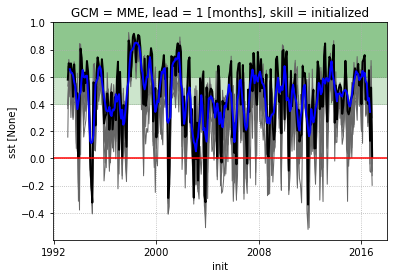

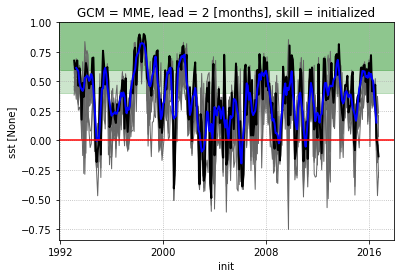

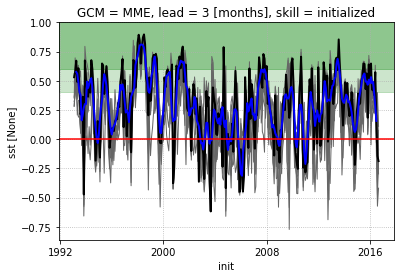

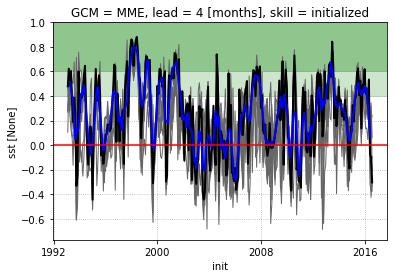

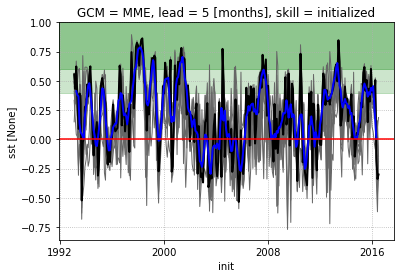

In [88]:
for lead in ACC_variability.lead.data:
    f, ax = plt.subplots()
    for GCM in GCMs:
        ACC_variability.sel(skill='initialized', GCM=GCM, lead=lead)[varname].plot(ax=ax, lw=1, color="0.4")
    ACC_variability.sel(skill='initialized',GCM="MME", lead=lead)[varname].plot(ax=ax, color="k", lw=2)
    ACC_variability.sel(skill='initialized',GCM="MME", lead=lead)[varname].rolling(
        {"init": 5}, center=True
    ).mean().plot(ax=ax, color="b", lw=2)
    ax.grid(ls=":")
    ax.axhspan(0.4, 1, color="g", alpha=0.2)
    ax.axhspan(0.6, 1, color="g", alpha=0.3)
    ax.set_ylim(None, 1)
    ax.axhline(0, color="r")
    f.savefig(
        fig_path.joinpath(
            f"ACC_variability_{period}_C3S_{domain_name}_domain_{varname}_verif_{use_verif.upper()}_maximize_alignment.png"
        ),
        dpi=200,
        bbox_inches="tight",
        facecolor="w",
    )
    f.savefig(
        fig_path.joinpath(
            f"ACC_variability_{period}_C3S_{domain_name}_domain_{varname}_verif_{use_verif.upper()}_maximize_alignment.pdf"
        ),
        bbox_inches="tight",
        facecolor="w",
    );

## extract the MME ACC variability, we could use it later to investigate what controls it (ENSO, etc)

In [89]:
MME_ACC_variability = ACC_variability.sel(GCM="MME", lead=ACC_variability.lead.min())[
    varname
]

In [90]:
MME_ACC_variability.to_netcdf(f"../outputs/MME_ACC_variability_{varname}_{period}.nc")

### Now calculates the ACC for all init times, along lat and lon 

In [91]:
hindcast = hindcast.load()

In [92]:
ACC = hindcast.verify(
    metric="acc", comparison="e2o", dim=["init", "lat", "lon"], alignment="maximize", reference=["persistence", "climatology"]
)

INFO:root:initialized | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-05-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-02-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-02-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:

In [108]:
ACC_with_persistence = ACC[varname].to_dataframe()[varname].unstack()

In [109]:
ACC_df = ACC_with_persistence.xs('initialized')

In [110]:
persistence_df_climpred = ACC_with_persistence.xs('persistence')

In [111]:
persistence_df_climpred = persistence_df_climpred.loc[:,['MME']]

In [112]:
persistence_df_climpred.columns = ['persistence']

In [113]:
climatology_df = ACC_with_persistence.xs('climatology')

In [114]:
climatology_df = climatology_df.loc[:,['MME']]

In [115]:
climatology_df.columns = ['climatology']

In [116]:
persistence_df_climpred

,persistence
lead,
1,0.643842
2,0.401778
3,0.291967
4,0.232167
5,0.174911


In [117]:
persistence_df

,persistence (lagged)
1,0.402337
2,0.292787
3,0.231747
4,0.175480
5,0.139392


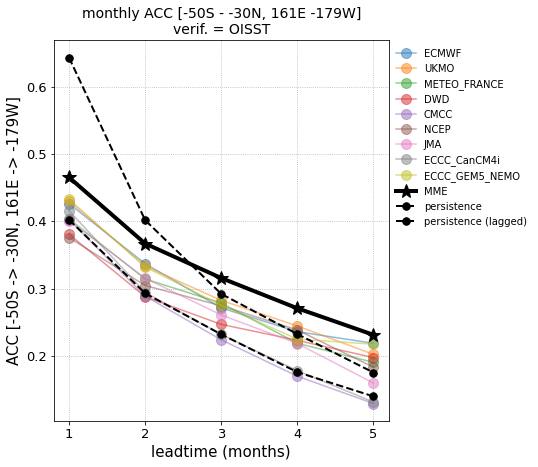

In [119]:
f, ax = plt.subplots(figsize=(6, 7))

ACC_df.loc[:, GCMs].plot(marker="o", markersize=10, ax=ax, alpha=0.5)

ACC_df.loc[:, "MME"].plot(
    marker="*", markersize=15, ax=ax, color="k", label="MME", lw=4
)

persistence_df_climpred.loc[:, "persistence"].plot(
    marker=".", markersize=15, ax=ax, color="k", label="persistence", lw=2, ls='--'
)

persistence_df.loc[:, "persistence (lagged)"].plot(
    marker=".", markersize=15, ax=ax, color="k", label="persistence (lagged)", lw=2, ls='--'
)


ax.legend()
ax.set_xlabel("leadtime (months)", fontsize=15)
ax.set_ylabel(
    f"ACC [{domain[2]}S -> {domain[3]}N, {domain[0]}E -> {domain[1] - 360}W]",
    fontsize=15,
)
ax.set_xticks(ACC.lead.data)
ax.grid(ls=":")
ax.set_title(
    f"{period} ACC [{domain[2]}S - {domain[3]}N, {domain[0]}E {domain[1] - 360}W]\nverif. = {use_verif.upper()}",
    fontsize=14,
    loc="center",
)
[l.set_fontsize(13) for l in ax.xaxis.get_ticklabels()]
[l.set_fontsize(13) for l in ax.yaxis.get_ticklabels()]



plt.legend(loc=(1.01, 0.5), frameon=False)

f.savefig(
    fig_path.joinpath(
        f"ACC_{period}_C3S_{domain_name}_domain_{varname}_verif_{use_verif.upper()}_maximize_alignment.png"
    ),
    dpi=200,
    bbox_inches="tight",
    facecolor="w",
)

f.savefig(
    fig_path.joinpath(
        f"ACC_{period}_C3S_{domain_name}_domain_{varname}_verif_{use_verif.upper()}_maximize_alignment.pdf"
    ),
    bbox_inches="tight",
    facecolor="w",
);

### same thing for the RMSE

In [123]:
RMSE = hindcast.verify(
    metric="rmse", comparison="e2o", dim=["init", "lat", "lon"], alignment="maximize", reference=['persistence','climatology']
)

INFO:root:initialized | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-05-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-02-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-02-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:

In [124]:
with ProgressBar():
    RMSE = RMSE.compute()

## casts RMSE xarray datasets to pandas dataframe

In [126]:
RMSE_df = RMSE[varname].to_dataframe()[varname].unstack()

In [127]:
RMSE_df.head()

GCM                  ECMWF      UKMO  METEO_FRANCE       DWD      CMCC  \
skill       lead                                                         
initialized 1     0.539082  0.543202      0.556671  0.571370  0.536855   
            2     0.561283  0.580737      0.581439  0.596728  0.567146   
            3     0.577211  0.595439      0.586275  0.604585  0.579802   
            4     0.581553  0.605422      0.596224  0.601419  0.586505   
            5     0.583578  0.621346      0.596443  0.603244  0.593730   

GCM                   NCEP       JMA  ECCC_CanCM4i  ECCC_GEM5_NEMO       MME  
skill       lead                                                              
initialized 1     0.574905  0.543684      0.542556        0.529786  0.509179  
            2     0.597340  0.570487      0.574809        0.558770  0.537814  
            3     0.602230  0.583102      0.582232        0.572263  0.548005  
            4     0.606603  0.590241      0.591393        0.580820  0.554203  
            5     0.621262  0.608898      0.597917        0.577649  0.561554

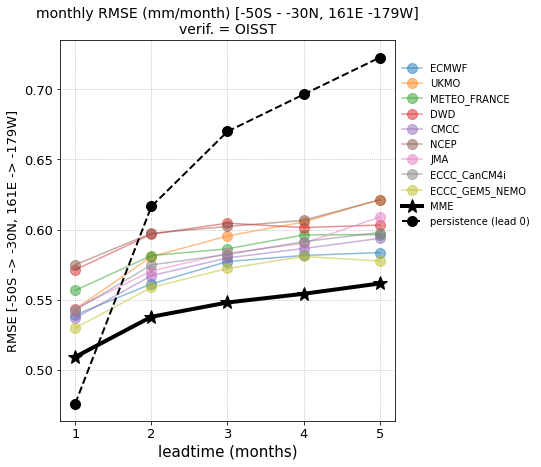

In [133]:
f, ax = plt.subplots(figsize=(6, 7))

RMSE_df.xs('initialized').loc[:, GCMs].plot(marker="o", markersize=10, ax=ax, alpha=0.5)

RMSE_df.xs('initialized').loc[:, "MME"].plot(
    marker="*", markersize=15, ax=ax, color="k", label="MME", lw=4
)



RMSE_df.xs('persistence').loc[:, "MME"].plot(
    marker="o", markersize=10, ax=ax, color="k", label="persistence (lead 0)", lw=2, ls='--'
)

ax.legend()

ax.set_xlabel("leadtime (months)", fontsize=15)
ax.set_ylabel(
    f"RMSE [{domain[2]}S -> {domain[3]}N, {domain[0]}E -> {domain[1] - 360}W]",
    fontsize=13,
)
ax.set_xticks(RMSE.lead.data)
ax.grid(ls=":")
ax.set_title(
    f"{period} RMSE (mm/month) [{domain[2]}S - {domain[3]}N, {domain[0]}E {domain[1] - 360}W]\nverif. = {use_verif.upper()}",
    fontsize=14,
    loc="center",
)
[l.set_fontsize(13) for l in ax.xaxis.get_ticklabels()]
[l.set_fontsize(13) for l in ax.yaxis.get_ticklabels()]

plt.legend(loc=(1.01, 0.5), frameon=False)

f.savefig(
    fig_path.joinpath(
        f"RMSE_{period}_C3S_{domain_name}_domain_{varname}_verif_{use_verif.upper()}_maximize_alignment.png"
    ),
    dpi=200,
    bbox_inches="tight",
    facecolor="w",
)

f.savefig(
    fig_path.joinpath(
        f"RMSE_{period}_C3S_{domain_name}_domain_{varname}_verif_{use_verif.upper()}_maximize_alignment.pdf"
    ),
    bbox_inches="tight",
    facecolor="w",
);

### ACC per month 

In [135]:
ACC_per_month = []

for label, group in MME.groupby("init.month"):

    print(f"calculating metric for month {label}\n")

    hindcast_month = HindcastEnsemble(group)

    hindcast_month = hindcast_month.add_observations(dset_obs_repeat)
    
    hindcast_month = hindcast_month.load()

    skill_monthly = hindcast_month.verify(
        metric="acc", comparison="e2o", dim=["init", "lat", "lon"], alignment="maximize", reference=['persistence','climatology']
    )

    with ProgressBar():

        skill_monthly = skill_monthly.compute()

    ACC_per_month.append(skill_monthly)

calculating metric for month 1



INFO:root:initialized | lead: 01 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-02-01 00:00:00-2016-02-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-04-01 00:00:00-2016-04-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-05-01 00:00:00-2016-05-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-06-01 00:00:00-2016-06-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-02-01 00:00:00-2016-02-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1994-01-01 00:00:00-2016-01-01 00:

calculating metric for month 2



INFO:root:initialized | lead: 01 | inits: 1993-02-01 00:00:00-2016-02-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-02-01 00:00:00-2016-02-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-04-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-02-01 00:00:00-2016-02-01 00:00:00 | verifs: 1993-05-01 00:00:00-2016-05-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-02-01 00:00:00-2016-02-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-06-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-02-01 00:00:00-2016-02-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-07-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-02-01 00:00:00-2016-02-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-02-01 00:00:00-2016-02-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-04-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-02-01 00:00:00-2016-02-01 00:

calculating metric for month 3



INFO:root:initialized | lead: 01 | inits: 1993-03-01 00:00:00-2016-03-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-04-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-03-01 00:00:00-2016-03-01 00:00:00 | verifs: 1993-05-01 00:00:00-2016-05-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-03-01 00:00:00-2016-03-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-06-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-03-01 00:00:00-2016-03-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-07-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-03-01 00:00:00-2016-03-01 00:00:00 | verifs: 1993-08-01 00:00:00-2016-08-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-03-01 00:00:00-2016-03-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-04-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-03-01 00:00:00-2016-03-01 00:00:00 | verifs: 1993-05-01 00:00:00-2016-05-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-03-01 00:00:00-2016-03-01 00:

calculating metric for month 4



INFO:root:initialized | lead: 02 | inits: 1993-04-01 00:00:00-2016-04-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-06-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-04-01 00:00:00-2016-04-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-07-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-04-01 00:00:00-2016-04-01 00:00:00 | verifs: 1993-08-01 00:00:00-2016-08-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-04-01 00:00:00-2016-04-01 00:00:00 | verifs: 1993-09-01 00:00:00-2016-09-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-04-01 00:00:00-2016-04-01 00:00:00 | verifs: 1993-05-01 00:00:00-2016-05-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-04-01 00:00:00-2016-04-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-06-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-04-01 00:00:00-2016-04-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-07-01 00:00:00
INFO:root:persistence | lead: 04 | inits: 1993-04-01 00:00:00-2016-04-01 00:

calculating metric for month 5



INFO:root:initialized | lead: 02 | inits: 1993-05-01 00:00:00-2016-05-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-07-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-05-01 00:00:00-2016-05-01 00:00:00 | verifs: 1993-08-01 00:00:00-2016-08-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-05-01 00:00:00-2016-05-01 00:00:00 | verifs: 1993-09-01 00:00:00-2016-09-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-05-01 00:00:00-2016-05-01 00:00:00 | verifs: 1993-10-01 00:00:00-2016-10-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-05-01 00:00:00-2016-05-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-06-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-05-01 00:00:00-2016-05-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-07-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-05-01 00:00:00-2016-05-01 00:00:00 | verifs: 1993-08-01 00:00:00-2016-08-01 00:00:00
INFO:root:persistence | lead: 04 | inits: 1993-05-01 00:00:00-2016-05-01 00:

calculating metric for month 6



INFO:root:initialized | lead: 01 | inits: 1993-06-01 00:00:00-2016-06-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-07-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-06-01 00:00:00-2016-06-01 00:00:00 | verifs: 1993-08-01 00:00:00-2016-08-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-06-01 00:00:00-2016-06-01 00:00:00 | verifs: 1993-09-01 00:00:00-2016-09-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-06-01 00:00:00-2016-06-01 00:00:00 | verifs: 1993-10-01 00:00:00-2016-10-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-06-01 00:00:00-2016-06-01 00:00:00 | verifs: 1993-11-01 00:00:00-2016-11-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-06-01 00:00:00-2016-06-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-07-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-06-01 00:00:00-2016-06-01 00:00:00 | verifs: 1993-08-01 00:00:00-2016-08-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-06-01 00:00:00-2016-06-01 00:

calculating metric for month 7



INFO:root:initialized | lead: 02 | inits: 1993-07-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-09-01 00:00:00-2016-09-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-07-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-10-01 00:00:00-2016-10-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-07-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-11-01 00:00:00-2016-11-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-07-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-12-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-07-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-08-01 00:00:00-2016-08-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-07-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-09-01 00:00:00-2016-09-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-07-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-10-01 00:00:00-2016-10-01 00:00:00
INFO:root:persistence | lead: 04 | inits: 1993-07-01 00:00:00-2016-07-01 00:

calculating metric for month 8



INFO:root:initialized | lead: 02 | inits: 1993-08-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-10-01 00:00:00-2016-10-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-08-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-11-01 00:00:00-2016-11-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-08-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-12-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-08-01 00:00:00-2015-08-01 00:00:00 | verifs: 1994-01-01 00:00:00-2016-01-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-08-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-09-01 00:00:00-2016-09-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-08-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-10-01 00:00:00-2016-10-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-08-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-11-01 00:00:00-2016-11-01 00:00:00
INFO:root:persistence | lead: 04 | inits: 1993-08-01 00:00:00-2016-08-01 00:

calculating metric for month 9



INFO:root:initialized | lead: 02 | inits: 1993-09-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-11-01 00:00:00-2016-11-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-09-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-12-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-09-01 00:00:00-2015-09-01 00:00:00 | verifs: 1994-01-01 00:00:00-2016-01-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-09-01 00:00:00-2015-09-01 00:00:00 | verifs: 1994-02-01 00:00:00-2016-02-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-09-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-10-01 00:00:00-2016-10-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-09-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-11-01 00:00:00-2016-11-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-09-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-12-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 04 | inits: 1993-09-01 00:00:00-2015-09-01 00:

calculating metric for month 10



INFO:root:initialized | lead: 01 | inits: 1993-10-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-11-01 00:00:00-2016-11-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-10-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-12-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-10-01 00:00:00-2015-10-01 00:00:00 | verifs: 1994-01-01 00:00:00-2016-01-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-10-01 00:00:00-2015-10-01 00:00:00 | verifs: 1994-02-01 00:00:00-2016-02-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-10-01 00:00:00-2015-10-01 00:00:00 | verifs: 1994-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-10-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-11-01 00:00:00-2016-11-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-10-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-12-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-10-01 00:00:00-2015-10-01 00:

calculating metric for month 11



INFO:root:initialized | lead: 01 | inits: 1993-11-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-12-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-11-01 00:00:00-2015-11-01 00:00:00 | verifs: 1994-01-01 00:00:00-2016-01-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-11-01 00:00:00-2015-11-01 00:00:00 | verifs: 1994-02-01 00:00:00-2016-02-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-11-01 00:00:00-2015-11-01 00:00:00 | verifs: 1994-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-11-01 00:00:00-2015-11-01 00:00:00 | verifs: 1994-04-01 00:00:00-2016-04-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-11-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-12-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-11-01 00:00:00-2015-11-01 00:00:00 | verifs: 1994-01-01 00:00:00-2016-01-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-11-01 00:00:00-2015-11-01 00:

calculating metric for month 12



INFO:root:initialized | lead: 02 | inits: 1993-12-01 00:00:00-2015-12-01 00:00:00 | verifs: 1994-02-01 00:00:00-2016-02-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-12-01 00:00:00-2015-12-01 00:00:00 | verifs: 1994-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-12-01 00:00:00-2015-12-01 00:00:00 | verifs: 1994-04-01 00:00:00-2016-04-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-12-01 00:00:00-2015-12-01 00:00:00 | verifs: 1994-05-01 00:00:00-2016-05-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-12-01 00:00:00-2015-12-01 00:00:00 | verifs: 1994-01-01 00:00:00-2016-01-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-12-01 00:00:00-2015-12-01 00:00:00 | verifs: 1994-02-01 00:00:00-2016-02-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-12-01 00:00:00-2015-12-01 00:00:00 | verifs: 1994-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:persistence | lead: 04 | inits: 1993-12-01 00:00:00-2015-12-01 00:

In [136]:
ACC_per_month = xr.concat(ACC_per_month, dim="month")

In [137]:
ACC_per_month["month"] = (("month"), np.arange(12) + 1)

In [138]:
ACC_per_month

<xarray.Dataset>
Dimensions:  (month: 12, skill: 3, lead: 5, GCM: 10)
Coordinates:
  * lead     (lead) int64 1 2 3 4 5
  * GCM      (GCM) object 'ECMWF' 'UKMO' ... 'ECCC_GEM5_NEMO' 'MME'
  * skill    (skill) <U11 'initialized' 'persistence' 'climatology'
  * month    (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    sst      (month, skill, lead, GCM) float64 0.1461 0.06058 ... -0.01476
Attributes:
    prediction_skill_software:     climpred https://climpred.readthedocs.io/
    skill_calculated_by_function:  HindcastEnsemble.verify()
    number_of_initializations:     23
    alignment:                     maximize
    metric:                        pearson_r
    comparison:                    e2o
    dim:                           ['init', 'lat', 'lon']
    reference:                     ['persistence', 'climatology']

In [139]:
ACC_per_month.lead.data[::-1]

array([5, 4, 3, 2, 1])

In [141]:
vmin = 0.3
vmax = 0.8

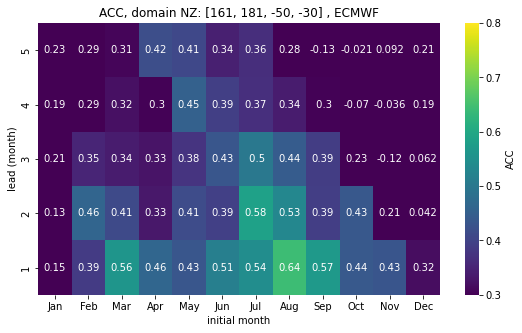

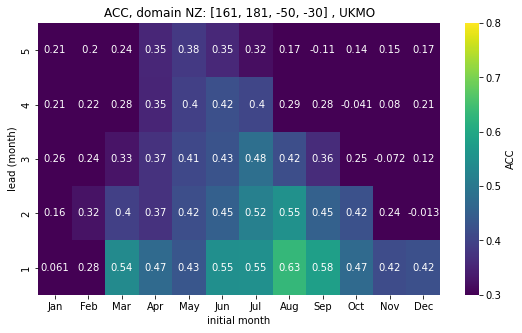

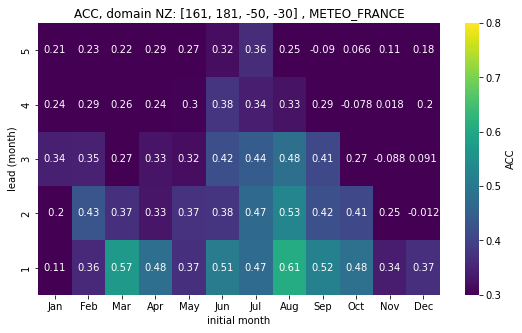

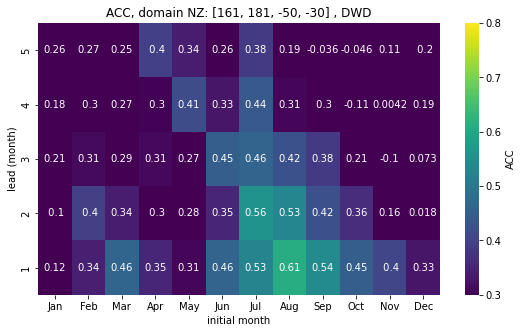

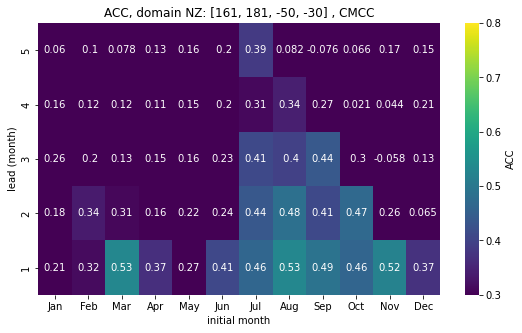

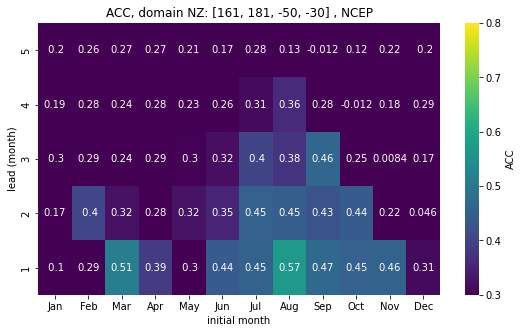

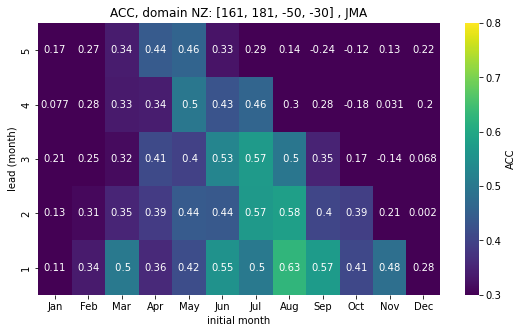

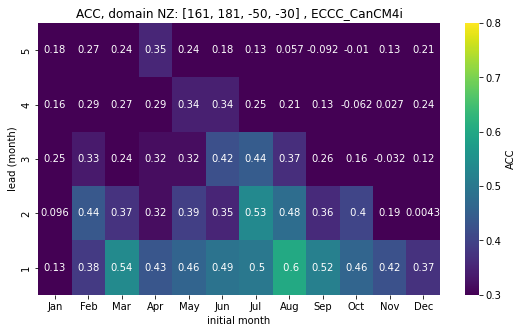

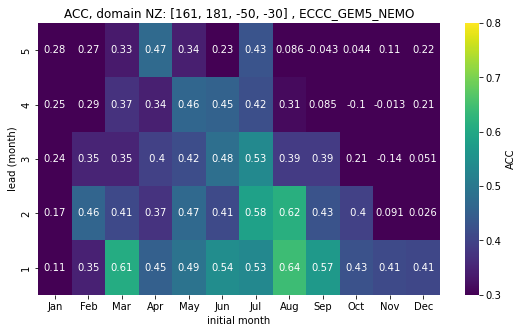

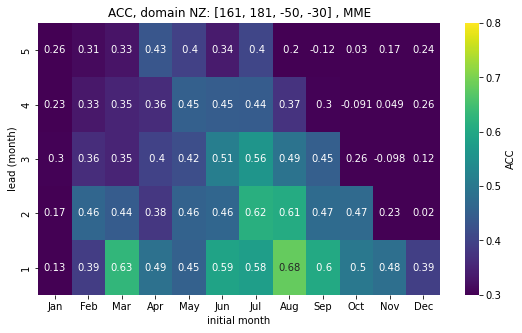

In [142]:
for GCM in GCMs + ["MME"]:
    f, ax = plt.subplots(figsize=(9, 5))
    _ = sns.heatmap(
        ACC_per_month.sel(skill='initialized', GCM=GCM)[varname].sortby("lead", ascending=False).transpose(),
        ax=ax,
        annot=True,
        fmt="4.2",
        cmap="viridis",
        vmin=vmin,
        vmax=vmax,
    )
    ax.set_title(f"ACC, domain {domain_name}: {domain} , {GCM}")
    ax.set_yticklabels(ACC_per_month.lead.data[::-1])
    ax.set_ylabel("lead (month)")
    ax.set_xticklabels(month_abbr[1:])
    ax.set_xlabel("initial month")
    f.axes[-1].set_ylabel("ACC")

    f.savefig(
        fig_path.joinpath(
            f"{period}_dependent_ACC_{GCM}_{domain_name}_domain_{varname}.png"
        ),
        dpi=200,
        bbox_inches="tight",
        facecolor="w",
    )

    f.savefig(
        fig_path.joinpath(
            f"{period}_dependent_ACC_{GCM}_{domain_name}_domain_{varname}.pdf"
        ),
        bbox_inches="tight",
        facecolor="w",
    )

In [145]:
ACC_per_month_MME = ACC_per_month.sel(GCM='MME')

In [155]:
ACC_per_month_MME_skill = ACC_per_month_MME.sel(skill='initialized') - ACC_per_month_MME.sel(skill='climatology')

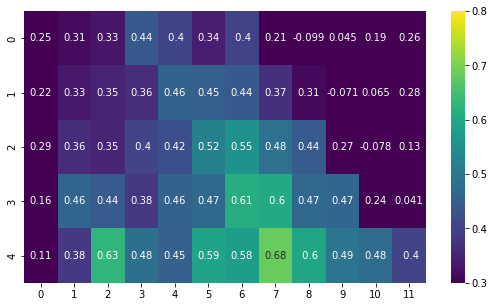

In [156]:
f, ax = plt.subplots(figsize=(9, 5))
_ = sns.heatmap(
    ACC_per_month_MME_skill[varname].sortby("lead", ascending=False).transpose(),
    ax=ax,
    annot=True,
    fmt="4.2",
    cmap="viridis",
    vmin=vmin,
    vmax=vmax,
)

### correlation maps 

In [157]:
R_map = hindcast.verify(
    metric="pearson_r", comparison="e2o", dim=["init"], alignment="maximize", reference='persistence'
)

INFO:root:initialized | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:00:00 | verifs: 1993-05-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1993-02-01 00:00:00-2016-08-01 00:00:00 | verifs: 1993-06-01 00:00:00-2016-12-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1993-02-01 00:00:00-2016-07-01 00:00:00 | verifs: 1993-07-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1993-02-01 00:00:00-2016-11-01 00:00:00 | verifs: 1993-03-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1993-02-01 00:00:00-2016-10-01 00:00:00 | verifs: 1993-04-01 00:00:00-2016-12-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1993-02-01 00:00:00-2016-09-01 00:

In [158]:
with ProgressBar():
    R_map = R_map.compute()

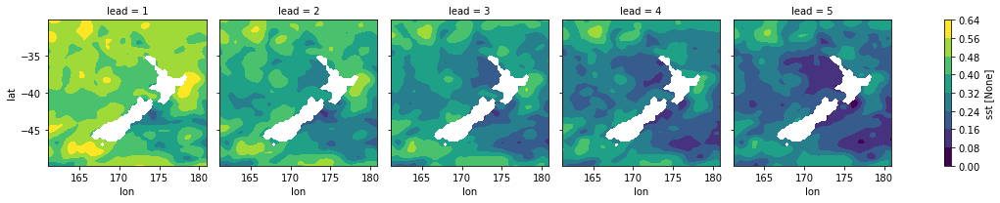

In [163]:
R_map.sel(skill='initialized', GCM='MME')[varname].plot.contourf(col='lead', levels=10)

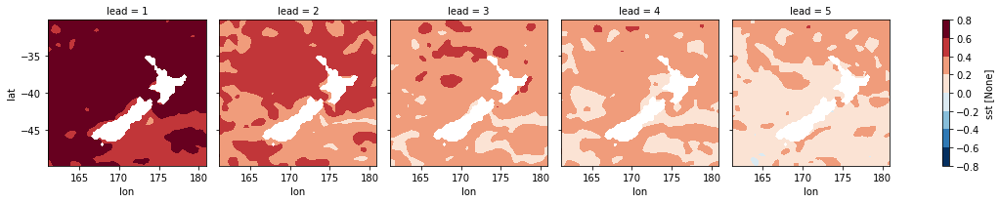

In [164]:
R_map.sel(skill='persistence', GCM='MME')[varname].plot.contourf(col='lead', levels=10)

### correlation per month 

In [172]:
R_map_per_month = hindcast.verify(
    metric="pearson_r", comparison="e2o", dim=["init"], alignment="maximize", reference='persistence', groupby='month'
)

INFO:root:initialized | lead: 01 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-02-01 00:00:00-2016-02-01 00:00:00
INFO:root:initialized | lead: 02 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:initialized | lead: 03 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-04-01 00:00:00-2016-04-01 00:00:00
INFO:root:initialized | lead: 04 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-05-01 00:00:00-2016-05-01 00:00:00
INFO:root:initialized | lead: 05 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-06-01 00:00:00-2016-06-01 00:00:00
INFO:root:persistence | lead: 01 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-02-01 00:00:00-2016-02-01 00:00:00
INFO:root:persistence | lead: 02 | inits: 1994-01-01 00:00:00-2016-01-01 00:00:00 | verifs: 1994-03-01 00:00:00-2016-03-01 00:00:00
INFO:root:persistence | lead: 03 | inits: 1994-01-01 00:00:00-2016-01-01 00:

### choose the colormap 

In [173]:
cmap = cmocean.cm.balance

In [174]:
cmap.set_bad("0.8")

In [175]:
MME.lead.data

array([1, 2, 3, 4, 5])

In [176]:
R_map_per_month.to_netcdf(
    f"../outputs/Correlation_maps_per_init_month_{period}_{varname}_{use_verif}_verif.nc"
)

In [177]:
levels = np.arange(-1, 1.1, 0.1)

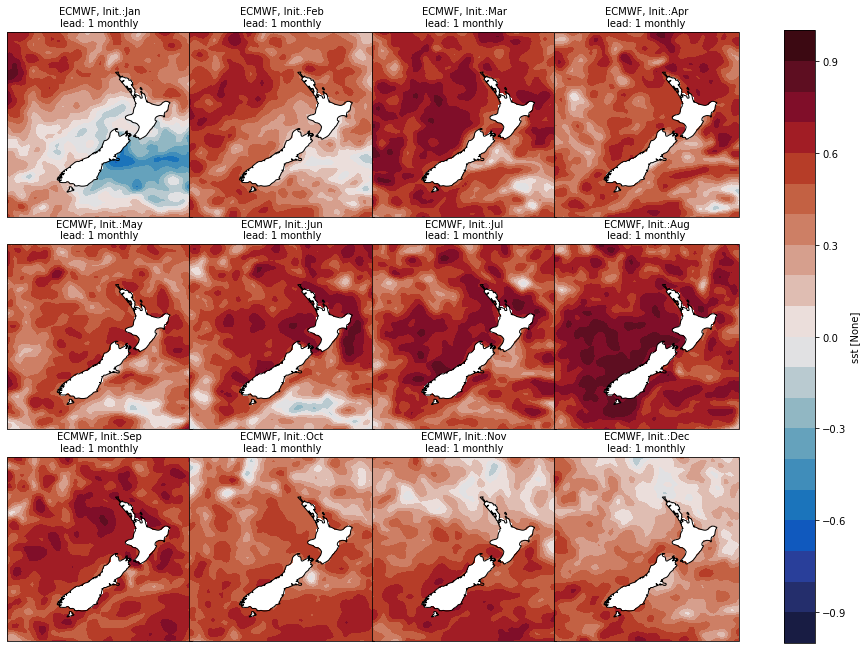

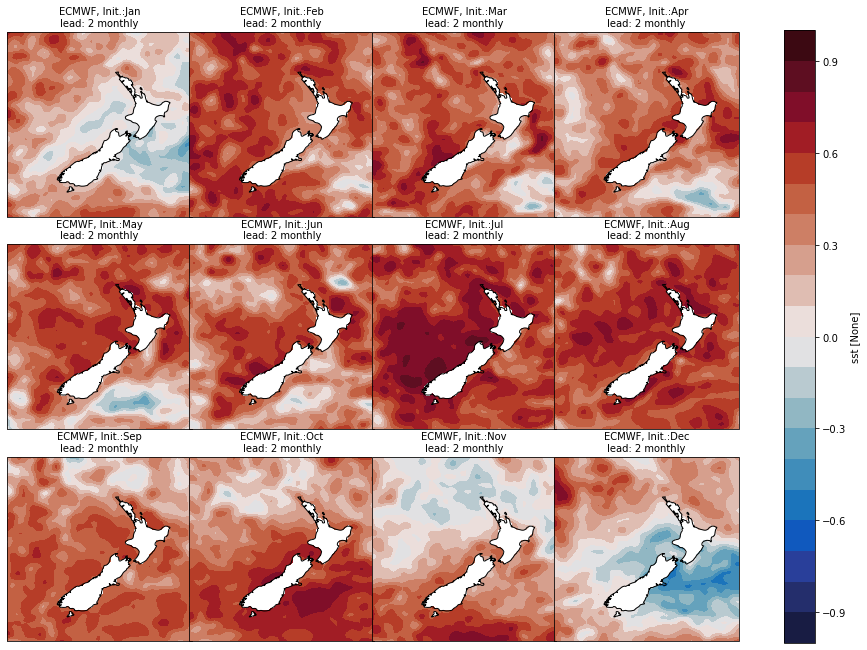

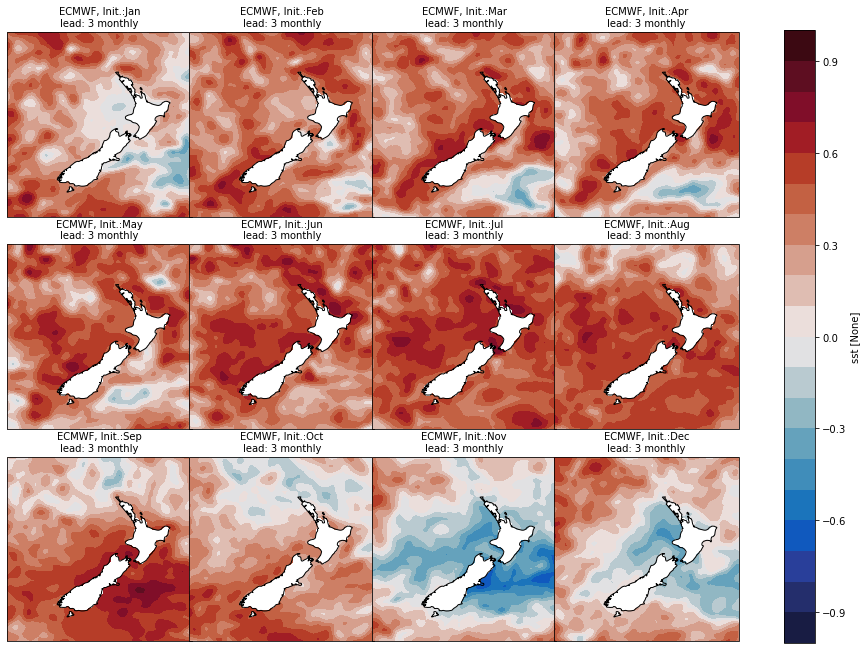

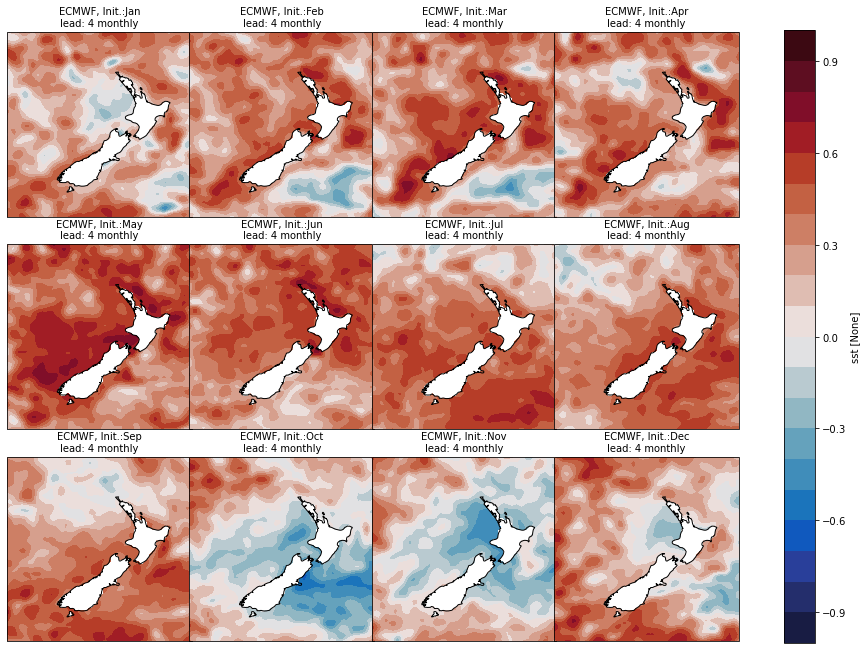

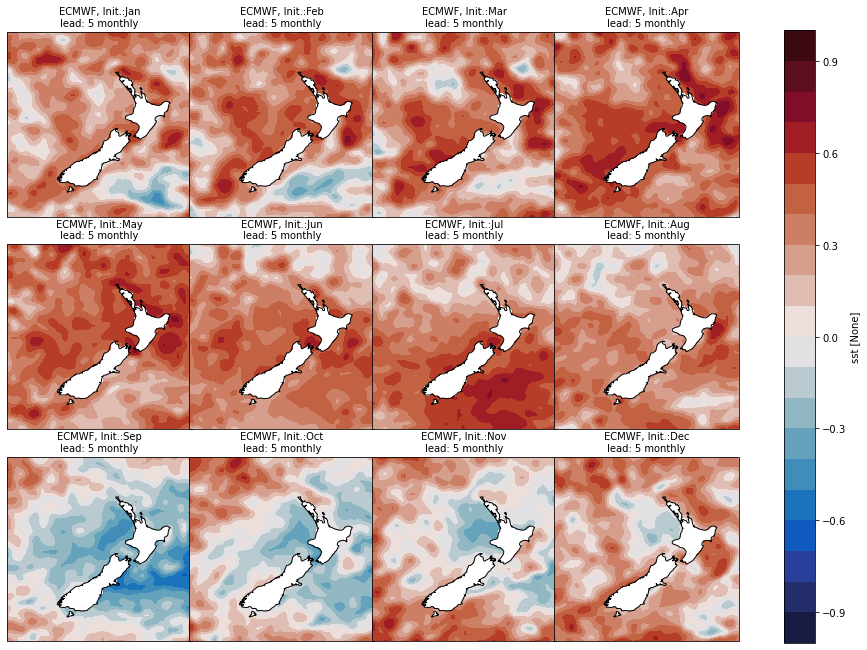

...

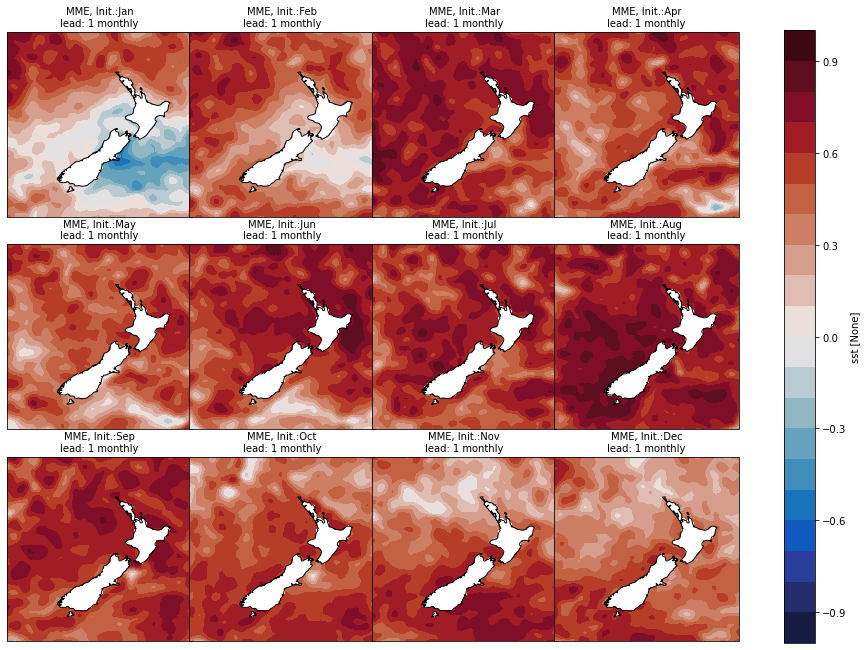

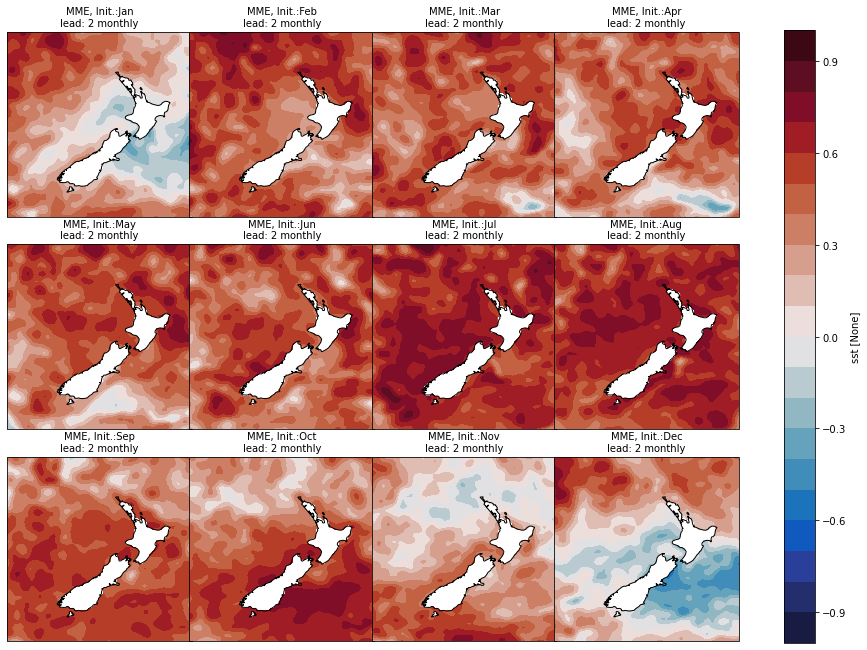

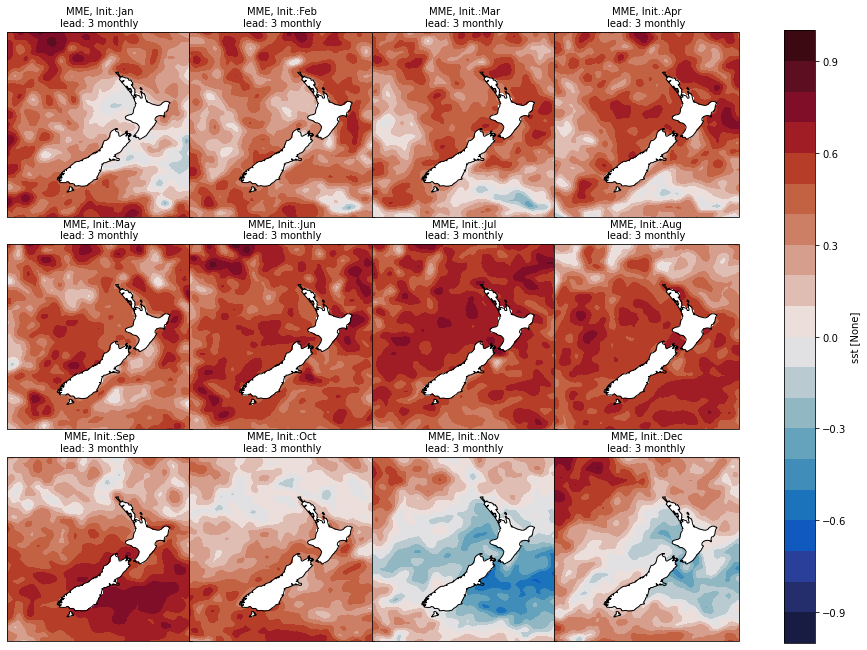

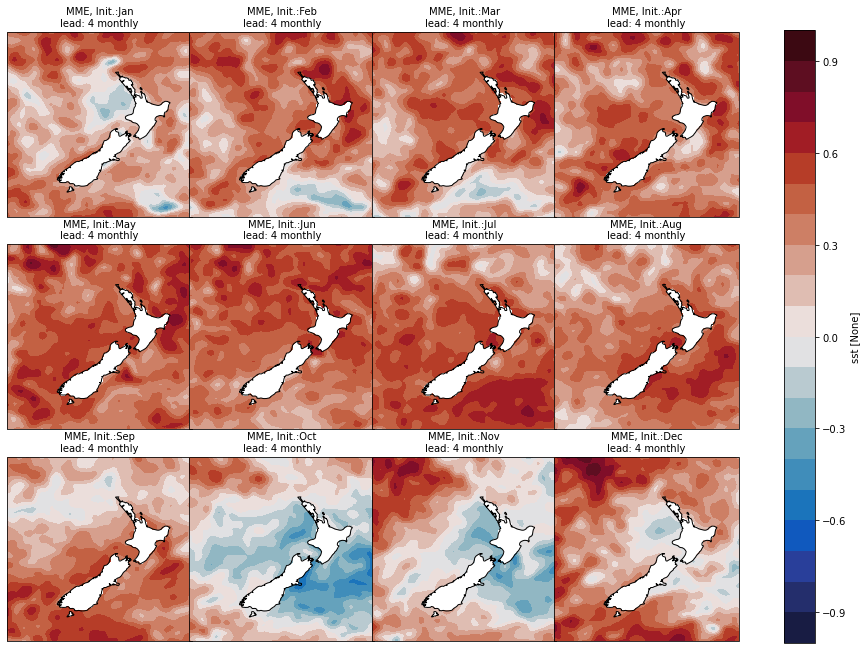

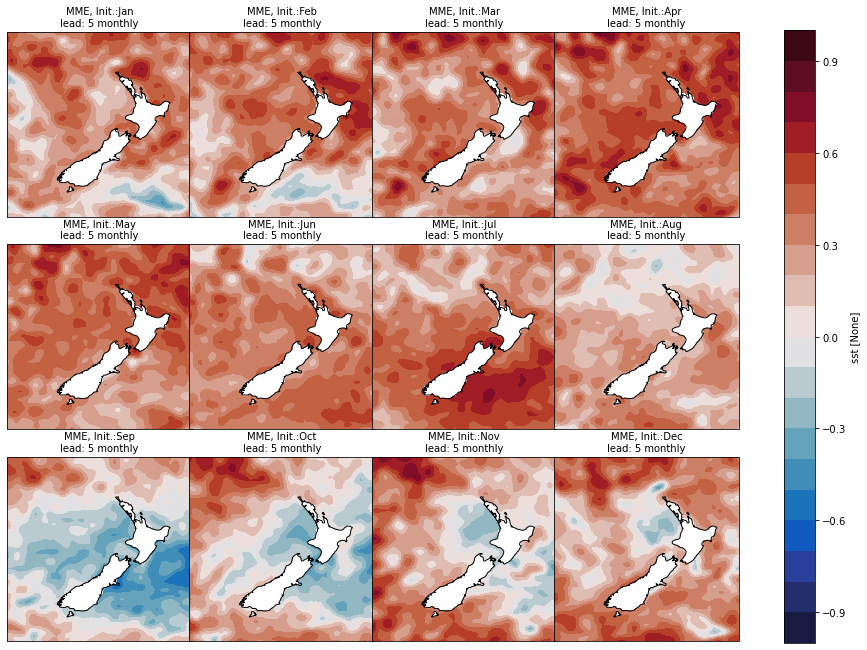

In [178]:
for gcm in MME.GCM.data:

    for lead in MME.lead.data:

        fg = R_map_per_month.sel(skill='initialized', GCM=gcm, lead=lead)[varname].plot.contourf(
            levels=levels,
            col="month",
            col_wrap=4,
            subplot_kws={"projection": ccrs.PlateCarree(central_longitude=180)},
            transform=ccrs.PlateCarree(),
            cmap=cmap,
        )
        [ax.coastlines() for ax in fg.axes.flat]

        for i, ax in enumerate(fg.axes.flat):

            ax.set_title(
                f"{gcm}, Init.:{month_abbr[i+1]}\nlead: {lead} {period}", fontsize=10
            )

        fg.fig.savefig(
            fig_path.joinpath(
                f"R_map_{gcm}_per_init_month_{period}_lead_{lead}_{domain_name}_domain_{varname}.png"
            ),
            dpi=200,
            bbox_inches="tight",
            facecolor="w",
        )
        
        fg.fig.savefig(
            fig_path.joinpath(
                f"R_map_{gcm}_per_init_month_{period}_lead_{lead}_{domain_name}_domain_{varname}.pdf"
            ),
            bbox_inches="tight",
            facecolor="w",
        )
        
        
        
        # plt.close(fg.fig)

        # clear_output(wait=True)

### Now map the correlation coefficients for DJF and JJA target seasons (only makes sense if `period` == 'seasonal')

### selects the GCM (or MME) here 

In [179]:
GCM = "MME"

In [180]:
vmin = -1
vmax = 1
step = 0.1

In [181]:
cbar_kwargs = {
    "shrink": 0.9,
    "orientation": "vertical",
    "aspect": 20,
    "label": "Pearson's R",
    "ticks": np.arange(vmin, vmax + step * 2, step * 2),
    "boundaries": np.arange(vmin, vmax + step * 2, step * 2),
}

In [182]:
if period == "seasonal":

    f, axes = plt.subplots(
        figsize=(16, 7),
        nrows=2,
        ncols=3,
        subplot_kw=dict(projection=ccrs.PlateCarree(central_longitude=180)),
    )

    R_map_per_month.sel(month=11, lead=3, GCM=GCM)[varname].plot.contourf(
        levels=levels,
        cmap=cmap,
        ax=axes[0, 0],
        transform=ccrs.PlateCarree(),
        cbar_kwargs=cbar_kwargs,
    )

    axes[0, 0].set_title("DJF target season (init. Nov)")

    axes[0, 0].coastlines(resolution="10m")

    R_map_per_month.sel(month=10, lead=4, GCM=GCM)[varname].plot.contourf(
        levels=levels,
        cmap=cmap,
        ax=axes[0, 1],
        transform=ccrs.PlateCarree(),
        cbar_kwargs=cbar_kwargs,
    )

    axes[0, 1].set_title("DJF target season (init. Oct)")

    axes[0, 1].coastlines(resolution="10m")

    R_map_per_month.sel(month=9, lead=5, GCM=GCM)[varname].plot.contourf(
        levels=levels,
        cmap=cmap,
        ax=axes[0, 2],
        transform=ccrs.PlateCarree(),
        cbar_kwargs=cbar_kwargs,
    )

    axes[0, 2].set_title("DJF target season (init. Sep.)")

    axes[0, 2].coastlines(resolution="10m")

    R_map_per_month.sel(month=5, lead=3, GCM=GCM)[varname].plot.contourf(
        levels=levels,
        cmap=cmap,
        ax=axes[1, 0],
        transform=ccrs.PlateCarree(),
        cbar_kwargs=cbar_kwargs,
    )

    axes[1, 0].set_title("JJA target season (init. May)")

    axes[1, 0].coastlines(resolution="10m")

    R_map_per_month.sel(month=4, lead=4, GCM=GCM)[varname].plot.contourf(
        levels=levels,
        cmap=cmap,
        ax=axes[1, 1],
        transform=ccrs.PlateCarree(),
        cbar_kwargs=cbar_kwargs,
    )

    axes[1, 1].set_title("JJA target season (init. Apr.)")

    axes[1, 1].coastlines(resolution="10m")

    R_map_per_month.sel(month=3, lead=5, GCM=GCM)[varname].plot.contourf(
        levels=levels,
        cmap=cmap,
        ax=axes[1, 2],
        transform=ccrs.PlateCarree(),
        cbar_kwargs=cbar_kwargs,
    )

    axes[1, 2].set_title("JJA target season (init. Mar.)")

    axes[1, 2].coastlines(resolution="10m")

    f.savefig(
        fig_path.joinpath(f"R_maps_DJF_JJA_{varname}_{domain_name}_{GCM}.png"),
        dpi=200,
        bbox_inches="tight",
        facecolor="w",
    )
    f.savefig(
        fig_path.joinpath(f"R_maps_DJF_JJA_{varname}_{domain_name}_{GCM}.pdf"),
        bbox_inches="tight",
        facecolor="w",
    )

### this for monthly hindcasts Correlation maps 

In [183]:
cbar_kwargs.update(pad=0.01)

In [184]:
if len(month_abbr) <= 13:
    month_abbr = list(month_abbr)[1:] + list(month_abbr)[1:]

target month 1, lead 1, init month = 12
target month 1, lead 2, init month = 11
target month 1, lead 3, init month = 10
target month 1, lead 4, init month = 9
target month 1, lead 5, init month = 8
--------------------
target month 2, lead 1, init month = 1
target month 2, lead 2, init month = 12
target month 2, lead 3, init month = 11
target month 2, lead 4, init month = 10
target month 2, lead 5, init month = 9
--------------------
target month 3, lead 1, init month = 2
target month 3, lead 2, init month = 1
target month 3, lead 3, init month = 12
target month 3, lead 4, init month = 11
target month 3, lead 5, init month = 10
--------------------
target month 4, lead 1, init month = 3
target month 4, lead 2, init month = 2
target month 4, lead 3, init month = 1
target month 4, lead 4, init month = 12
target month 4, lead 5, init month = 11
--------------------
target month 5, lead 1, init month = 4
target month 5, lead 2, init month = 3
target month 5, lead 3, init month = 2
target m

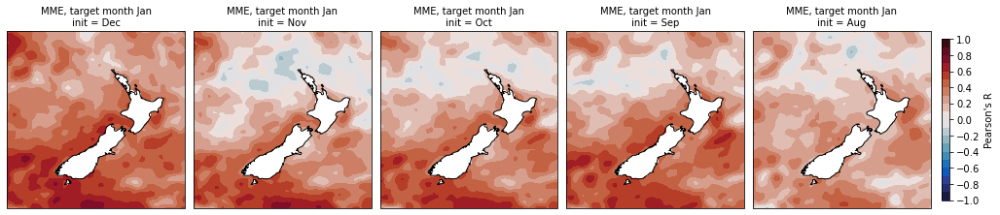

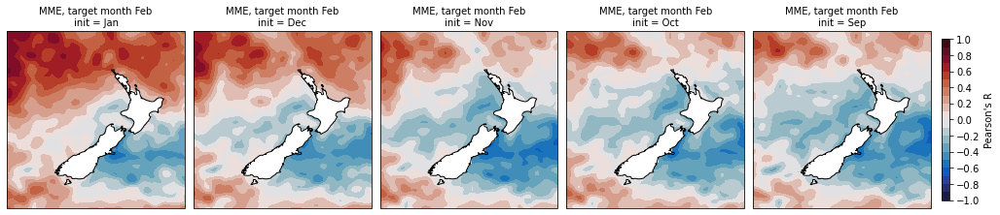

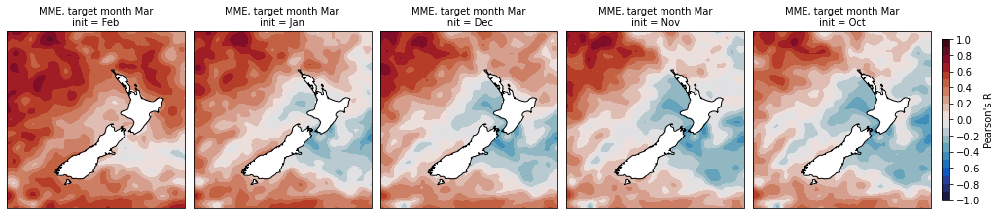

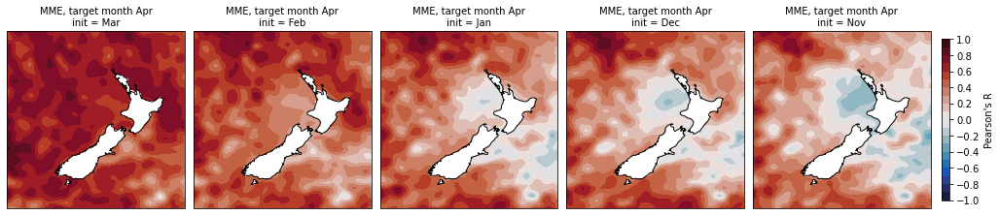

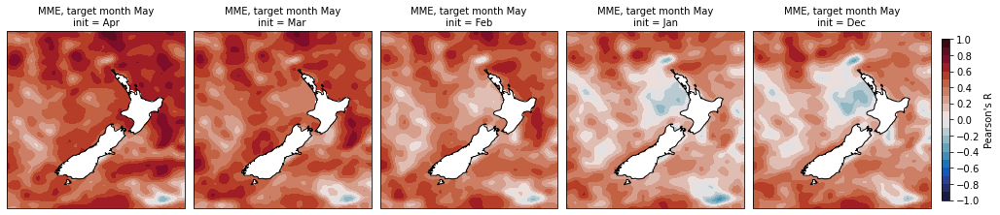

...

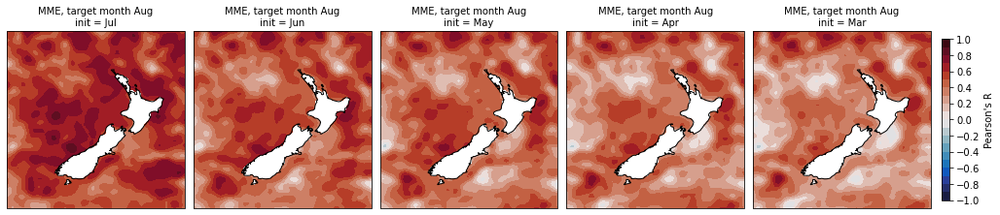

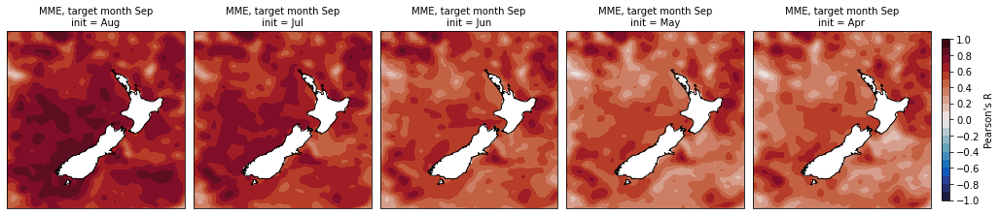

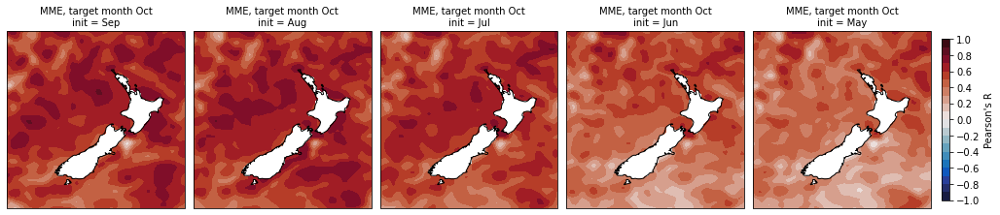

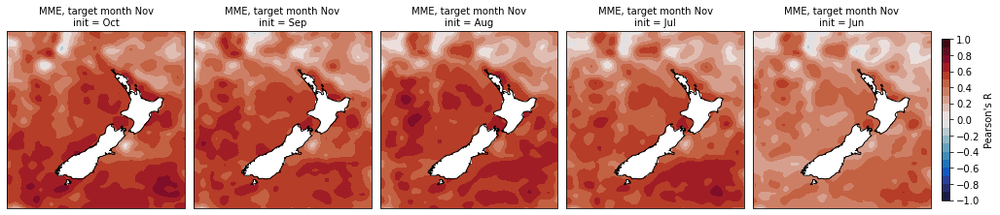

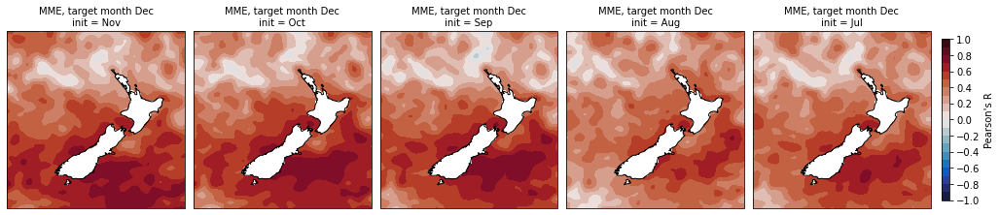

In [185]:
for target_month in np.arange(12) + 1:

    R_sub_concat = []

    for lead in R_map_per_month.lead.data:

        m = (target_month - lead) % 12

        if m == 0:

            m = 12

        print(f"target month {target_month}, lead {lead}, init month = {m}")

        R_sub = R_map_per_month.sel(skill='initialized', month=m, lead=lead, GCM=GCM)

        R_sub = R_sub.expand_dims({"init": [month_abbr[m + 12 - 1]]})

        R_sub_concat.append(R_sub)

    R_sub_concat = xr.concat(R_sub_concat, dim="init")

    print(20 * "-")

    ### plot

    fg = R_sub_concat[varname].plot.contourf(
        levels=levels,
        col="init",
        subplot_kws={"projection": ccrs.PlateCarree(central_longitude=180)},
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        cbar_kwargs=cbar_kwargs,
    )
    [ax.coastlines() for ax in fg.axes.flat]

    for i, ax in enumerate(fg.axes.flat):

        ax.set_title(
            f"{GCM}, target month {month_abbr[target_month + 12 - 1]}\n{ax.get_title()}",
            fontsize=10,
        )

    fg.fig.savefig(
        fig_path.joinpath(
            f"R_map_target_month_{month_abbr[target_month + 12 - 1]}_{GCM}_{period}_{domain_name}_domain_{varname}.png"
        ),
        dpi=200,
        bbox_inches="tight",
        facecolor="w",
    );
    fg.fig.savefig(
        fig_path.joinpath(
            f"R_map_target_month_{month_abbr[target_month + 12 - 1]}_{GCM}_{period}_{domain_name}_domain_{varname}.pdf"
        ),
        bbox_inches="tight",
        facecolor="w",
    );

target month 1, lead 1, init month = 12
target month 1, lead 2, init month = 11
target month 1, lead 3, init month = 10
target month 1, lead 4, init month = 9
target month 1, lead 5, init month = 8
--------------------
target month 2, lead 1, init month = 1
target month 2, lead 2, init month = 12
target month 2, lead 3, init month = 11
target month 2, lead 4, init month = 10
target month 2, lead 5, init month = 9
--------------------
target month 3, lead 1, init month = 2
target month 3, lead 2, init month = 1
target month 3, lead 3, init month = 12
target month 3, lead 4, init month = 11
target month 3, lead 5, init month = 10
--------------------
target month 4, lead 1, init month = 3
target month 4, lead 2, init month = 2
target month 4, lead 3, init month = 1
target month 4, lead 4, init month = 12
target month 4, lead 5, init month = 11
--------------------
target month 5, lead 1, init month = 4
target month 5, lead 2, init month = 3
target month 5, lead 3, init month = 2
target m

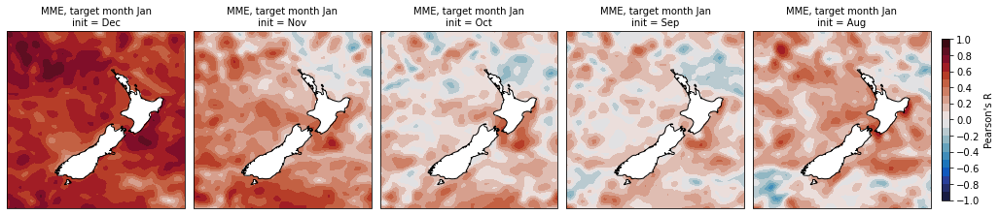

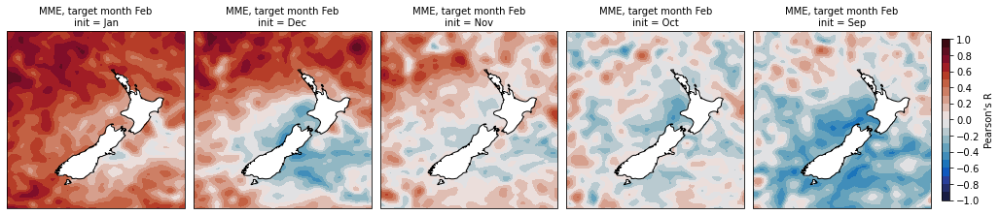

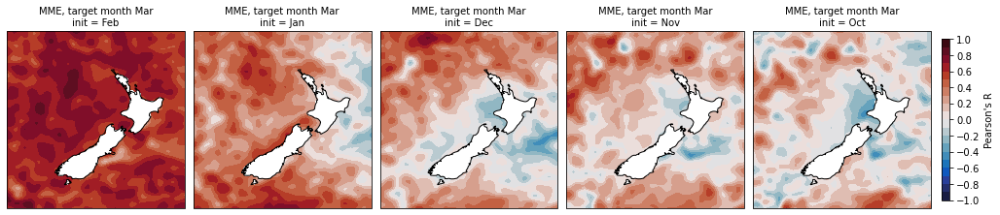

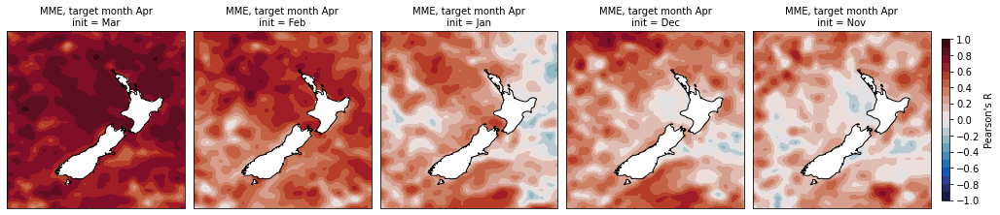

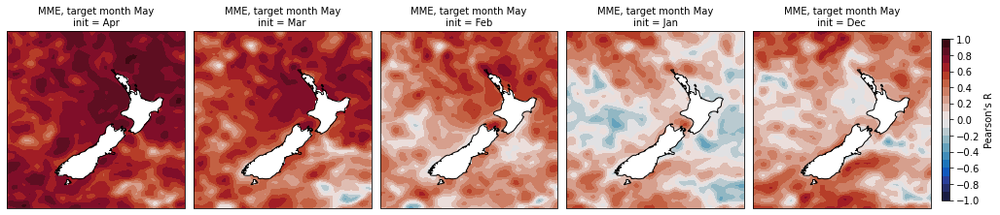

...

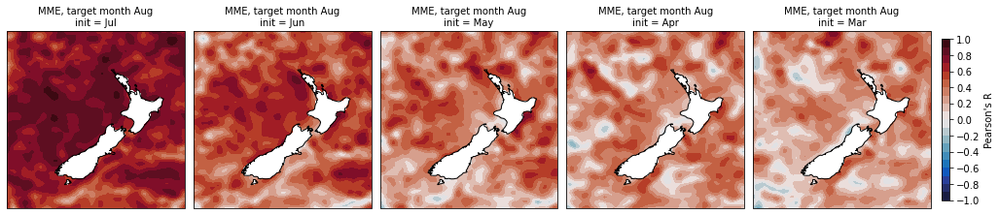

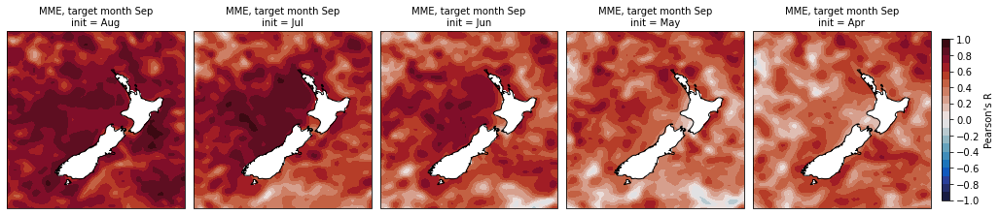

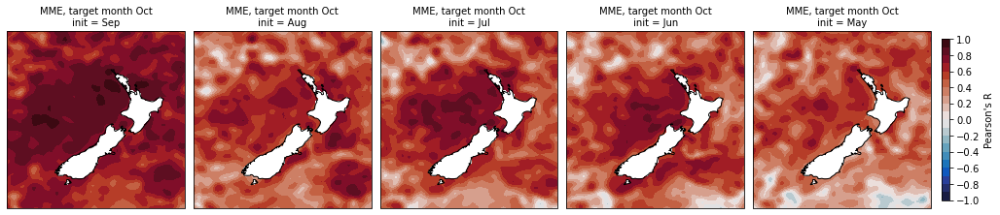

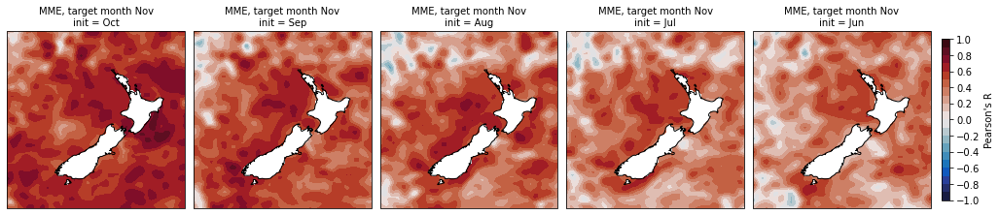

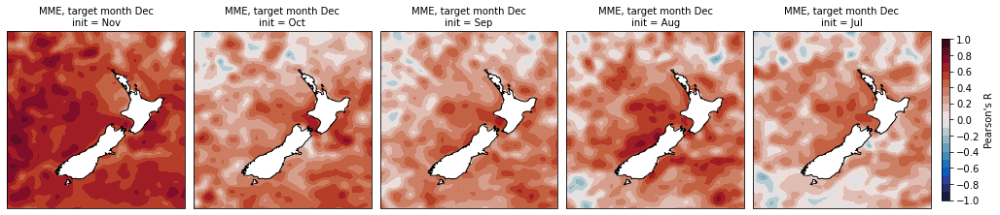

In [188]:
for target_month in np.arange(12) + 1:

    R_sub_concat = []

    for lead in R_map_per_month.lead.data:

        m = (target_month - lead) % 12

        if m == 0:

            m = 12

        print(f"target month {target_month}, lead {lead}, init month = {m}")

        R_sub = R_map_per_month.sel(skill='persistence', month=m, lead=lead, GCM=GCM)

        R_sub = R_sub.expand_dims({"init": [month_abbr[m + 12 - 1]]})

        R_sub_concat.append(R_sub)

    R_sub_concat = xr.concat(R_sub_concat, dim="init")

    print(20 * "-")

    ### plot

    fg = R_sub_concat[varname].plot.contourf(
        levels=levels,
        col="init",
        subplot_kws={"projection": ccrs.PlateCarree(central_longitude=180)},
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        cbar_kwargs=cbar_kwargs,
    )
    [ax.coastlines() for ax in fg.axes.flat]

    for i, ax in enumerate(fg.axes.flat):

        ax.set_title(
            f"{GCM}, target month {month_abbr[target_month + 12 - 1]}\n{ax.get_title()}",
            fontsize=10,
        )

    fg.fig.savefig(
        fig_path.joinpath(
            f"R_map_target_month_{month_abbr[target_month + 12 - 1]}_{GCM}_{period}_{domain_name}_domain_{varname}_persistence_forecast.png"
        ),
        dpi=200,
        bbox_inches="tight",
        facecolor="w",
    );
    fg.fig.savefig(
        fig_path.joinpath(
            f"R_map_target_month_{month_abbr[target_month + 12 - 1]}_{GCM}_{period}_{domain_name}_domain_{varname}_persistence_forecast.pdf"
        ),
        bbox_inches="tight",
        facecolor="w",
    );

In [232]:
dset_obs_shift = dset_obs.shift({'time':2}).dropna(dim='time', how='all')

In [233]:
obs_time, obs_persistence_time = xr.align(dset_obs.time, dset_obs_shift.time) 

In [234]:
dset_obs = dset_obs.sel(time=obs_time)

In [235]:
dset_obs_shift = dset_obs.sel(time=obs_time)

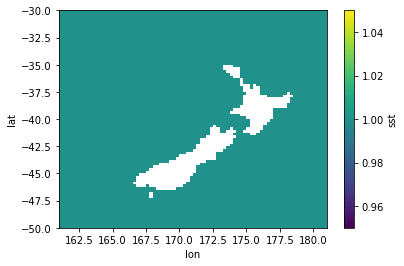

In [236]:
xs.pearson_r(dset_obs, dset_obs_shift, dim='time')['sst'].plot()

In [226]:
R_persistence_jan = xs.pearson_r(dset_obs.sel(time=obs_time.dt.month==1), dset_obs_shift.sel(time=obs_persistence_time.time.dt.month==1), dim='time') 

IndexError: Boolean index has wrong length: 286 instead of 288

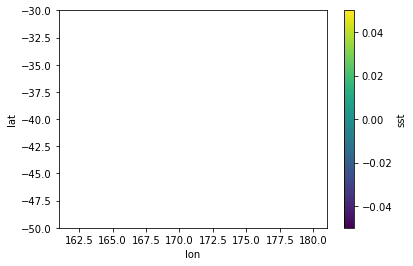

In [208]:
R_persistence_jan['sst'].plot()

In [191]:
xs.pearson_r(dset_obs, dset_obs.shift(time=2))

<xarray.Dataset>
Dimensions:  ()
Data variables:
    sst      float64 dask.array<chunksize=(), meta=np.ndarray>

In [186]:
hindcast.get_initialized().to_netcdf(f'../outputs/hindcast/{period}/climpred_hindcasts_initialised_ds.nc')

In [187]:
hindcast.get_observations().to_netcdf(f'../outputs/hindcast/{period}/climpred_hindcasts_observations_{use_verif}_ds.nc')